# SETUP

## Check environment

In [1]:
USE_GPU = True

## Libraries

In [2]:
# System
import os
import glob
import shutil
import copy
import re
from datetime import datetime
import logging
import sys

# Data
import numpy as np
import pandas as pd

# Visualization
import seaborn as sns
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm

# Data processing
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split, TimeSeriesSplit, cross_val_score
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

# Model
import tensorflow as tf
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, root_mean_squared_error, mean_absolute_percentage_error
from keras import Input, Model, Sequential
from keras.layers import Dense, LSTM, RepeatVector, TimeDistributed, Dropout, GRU, Conv1D, MaxPooling1D, Flatten
from keras.utils import plot_model
from keras.saving import load_model
from keras.callbacks import LearningRateScheduler, ModelCheckpoint
from keras.optimizers import Adam
from keras.losses import MeanAbsoluteError
from keras.losses import MeanAbsoluteError, MeanSquaredError
import keras.backend as K

# Append the custom libraries to system path
sys.path.append("/le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project")

# Configure device
if not USE_GPU:
    print("Using CPU to train")
    os.environ['CUDA_VISIBLE_DEVICES'] = '-1'
else:
    print("Using GPU to train")

# Custom libraries written by myself
from src.plot import plot_1_data, plot_2_data, plot_3_data, plot_prediction
from src.reduction_model.lstm_s2s import LSTMSeq2SeqReduction
from src.reduction_model.gru_s2s import GRUSeq2SeqReduction
from src.reduction_model.cnnlstm_s2s import CNNLSTMSeq2SeqReduction
from src.prediction_model.lstm import LSTMPrediction, inferenceLSTM
from src.loop_model import generate_loopresults, choose_the_best
from src.reduce_data_utils import prepareReducedData
from src.data_utils import mice

# Configuration reader
from src.config_reader import ConfigurationReader

# Checking Tensorflow
print(tf.__version__)
print(tf.config.list_physical_devices('GPU'))
print(tf.config.list_physical_devices('CPU'))

E0000 00:00:1758771936.786232 2125751 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1758771936.794490 2125751 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1758771936.818884 2125751 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1758771936.818938 2125751 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1758771936.818941 2125751 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1758771936.818943 2125751 computation_placer.cc:177] computation placer already registered. Please check linka

Using GPU to train
2.19.0
[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU')]


## Configuration

In [3]:
conf = ConfigurationReader("/le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/model_params.json").data

# Clear all temp folders
def cleanDir(input_dir):
    if os.path.exists(input_dir):
        shutil.rmtree(input_dir)
    os.makedirs(input_dir)

cleanDir(conf["workspace"]["saved_model_plot_dir"])
cleanDir(conf["workspace"]["saved_model_weight_dir"])
cleanDir(conf["workspace"]["data_statistic_dir"])
cleanDir(conf["workspace"]["data_by_station_dir"])
cleanDir(conf["workspace"]["data_by_location_dir"])
cleanDir(conf["workspace"]["best_model_weight_dir"])
cleanDir(conf["workspace"]["best_reduced_data_dir"])

# CMAQ DATA

## Load dataset

### Raw data

In [4]:
df_cmaq_raw = []
for csv_file in glob.glob(f'{conf["dataset"]["cmaq"]["file_dir"]}/*'):
    df_current_station = pd.read_csv(csv_file).dropna(axis=1, how="all")
    station = csv_file.split("/")[-1].split(".")[0]
    print(f"{csv_file} - {len(df_current_station)} records")
    df_current_station["station"] = station
    df_cmaq_raw.append(df_current_station)
df_cmaq_raw = pd.concat(df_cmaq_raw, axis=0, ignore_index=True)
df_cmaq_raw

/le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/concentration_station/216.csv - 7476 records
/le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/concentration_station/212.csv - 7476 records
/le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/concentration_station/201.csv - 7476 records
/le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/concentration_station/215.csv - 7476 records
/le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/concentration_station/213.csv - 7476 records
/le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/concentration_station/214.csv - 7476 records
/le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/concentration_station/211.csv - 7476 records


,Date,Time,PM25,PM10,O3,SO2,NO2,station
0,01/01/2022,7:00:00,4.962867,17.781220,0.098060,0.000077,0.000981,216
1,01/01/2022,8:00:00,6.538577,23.655580,0.079992,0.000105,0.001294,216
2,01/01/2022,9:00:00,7.173492,25.594369,0.063973,0.000132,0.001035,216
3,01/01/2022,10:00:00,7.377719,26.746649,0.052615,0.000131,0.000818,216
4,01/01/2022,11:00:00,6.629785,23.692133,0.044166,0.000090,0.000607,216
...,...,...,...,...,...,...,...,...
52327,31/12/2022,1:00:00,12.338016,44.975750,0.027149,0.000055,0.000068,211
52328,31/12/2022,2:00:00,12.207455,43.493079,0.026779,0.000055,0.000067,211
52329,31/12/2022,3:00:00,12.345228,45.676369,0.026994,0.000056,0.000067,211
52330,31/12/2022,4:00:00,12.455814,47.065511,0.026826,0.000057,0.000067,211


### Handle metadata

In [5]:
# Merge Date and Time columns
df_cmaq_raw["time"] = df_cmaq_raw["Time"] + " " + df_cmaq_raw["Date"]
df_cmaq_raw["time"] = df_cmaq_raw["time"].apply(lambda element: datetime.strptime(element, "%H:%M:%S %d/%m/%Y"))
df_cmaq_raw = df_cmaq_raw.assign(time=pd.to_datetime(df_cmaq_raw["time"]))
df_cmaq_raw = df_cmaq_raw.assign(station=df_cmaq_raw["station"].astype("int64"))
df_cmaq_raw.drop(columns=["Date", "Time"], inplace=True)

# Rename columns
df_cmaq_raw = df_cmaq_raw.rename(columns={name: f"{name.lower()}" for name in df_cmaq_raw.columns})

# Sort data by "station" then "time"
df_cmaq_raw.sort_values(by=["station", "time"], ascending=[True, True], inplace=True)

# Set index
df_cmaq_raw.set_index("time", inplace=True)

# Print
df_cmaq_raw

,pm25,pm10,o3,so2,no2,station
time,,,,,,
2022-01-01 07:00:00,8.070718,28.069728,0.098301,0.000047,0.001115,201
2022-01-01 08:00:00,9.922100,35.973360,0.078072,0.000062,0.001141,201
2022-01-01 09:00:00,11.191617,40.858557,0.061198,0.000082,0.000941,201
2022-01-01 10:00:00,11.655973,43.331055,0.050983,0.000087,0.000761,201
2022-01-01 11:00:00,11.074831,39.380184,0.042117,0.000068,0.000600,201
...,...,...,...,...,...,...
2022-12-31 01:00:00,9.481827,34.121409,0.026421,0.000149,0.002276,216
2022-12-31 02:00:00,9.389163,34.542116,0.026171,0.000148,0.002208,216
2022-12-31 03:00:00,9.472814,34.649932,0.026087,0.000151,0.002249,216


In [6]:
df_cmaq_raw.isnull().sum()

pm25       0
pm10       0
o3         0
so2        0
no2        0
station    0
dtype: int64

In [7]:
all_resampled_dfs = []
for station in df_cmaq_raw["station"].unique():
    df_cmaq_current_station = df_cmaq_raw[df_cmaq_raw["station"] == station]
    df_cmaq_current_station_resampled = df_cmaq_current_station.resample("D").mean()
    df_cmaq_current_station_resampled["station"] = station
    all_resampled_dfs.append(df_cmaq_current_station_resampled)

df_cmaq_daily = pd.concat(all_resampled_dfs, axis=0)
print(df_cmaq_daily["station"].unique())
df_cmaq_daily

[201 211 212 213 214 215 216]


,pm25,pm10,o3,so2,no2,station
time,,,,,,
2022-01-01,15.269127,48.407405,0.038950,0.000095,0.001809,201
2022-01-02,16.298580,59.344891,0.027448,0.000107,0.002403,201
2022-01-03,15.532542,56.512608,0.027952,0.000121,0.002359,201
2022-01-04,19.030452,66.483882,0.027218,0.000206,0.003297,201
2022-01-05,26.266464,82.340143,0.027566,0.000388,0.004734,201
...,...,...,...,...,...,...
2022-12-27,28.235250,78.640922,0.028089,0.001259,0.007881,216
2022-12-28,26.291384,77.514532,0.026661,0.000907,0.006642,216
2022-12-29,26.971063,63.326358,0.026366,0.000821,0.012799,216


# AOD DATA

## Load 2022 dataset

In [8]:
df_aod_raw_2022 = pd.read_excel(conf["dataset"]["aod2022"]["file_dir"])

print(df_aod_raw_2022.columns)
df_aod_raw_2022

Index(['time', 'ID', 'pm25', 'lat', 'lon', 'PM25_3km', 'TMP', 'RH', 'HPBL',
       'WSPD', 'PRES2M', 'AOD', 'OID', 'POP', 'ROAD_DEN_1km',
       'PRIM_ROAD_LEN_1km', 'NEAR_DIST', 'BARELAND', 'BUILTUP', 'CROPLAND',
       'GRASSLAND', 'TREECOVER', 'WATER', 'NDVI', 'Name'],
      dtype='object')


,time,ID,pm25,lat,lon,PM25_3km,TMP,RH,HPBL,WSPD,...,PRIM_ROAD_LEN_1km,NEAR_DIST,BARELAND,BUILTUP,CROPLAND,GRASSLAND,TREECOVER,WATER,NDVI,Name
0,2022-01-01,S4,23.768238,10.815839,106.717396,22.025597,28.261583,57.233841,721.996887,2.003031,...,2327.256348,2.546965,1876.639945,841524.8595,296.31157,3753.279890,91461.50468,61731.57713,1818.661486,"Trường THCS Cù Chính Lan, Thanh Đa, F27, Q.Bìn..."
1,2022-01-01,S5,14.221014,10.776415,106.687955,22.705284,27.787918,61.073841,659.863586,1.885687,...,7249.776367,21.703104,395.082094,877872.4121,0.00000,98.770523,121487.74380,0.00000,1721.431568,Tòa soạn Báo Thanh Niên - Nguyễn Đình Chiểu - Q3
2,2022-01-01,S6,21.405015,10.780482,106.659511,23.503082,27.787918,61.073841,659.863586,1.885687,...,2345.868408,6.057246,10370.904960,885181.4309,0.00000,8099.182920,95807.40771,0.00000,1879.344348,"MobiFone Thành Thái, Q10"
3,2022-01-01,S7,21.695652,10.783456,106.700622,22.705284,27.787918,61.073841,659.863586,1.885687,...,6885.987305,18.537305,296.311570,764977.7039,0.00000,1876.639945,232011.95950,0.00000,2700.122924,ĐSQ Mỹ
4,2022-01-02,S4,22.154723,10.815839,106.717396,22.711113,25.827082,57.916595,619.779785,1.286289,...,2327.256348,2.546965,1876.639945,841524.8595,296.31157,3753.279890,91461.50468,61731.57713,1818.661486,"Trường THCS Cù Chính Lan, Thanh Đa, F27, Q.Bìn..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
993,2022-12-30,S6,33.091428,10.780482,106.659511,19.854403,24.979719,64.868401,680.533081,3.893373,...,2345.868408,6.057246,10370.904960,885181.4309,0.00000,8099.182920,95807.40771,0.00000,1879.344348,"MobiFone Thành Thái, Q10"
994,2022-12-30,S7,40.166667,10.783456,106.700622,19.137615,24.979719,64.868401,680.533081,3.893373,...,6885.987305,18.537305,296.311570,764977.7039,0.00000,1876.639945,232011.95950,0.00000,2700.122924,ĐSQ Mỹ
995,2022-12-31,S4,27.879261,10.815839,106.717396,28.223820,26.630608,55.437901,607.372803,4.217750,...,2327.256348,2.546965,1876.639945,841524.8595,296.31157,3753.279890,91461.50468,61731.57713,1818.661486,"Trường THCS Cù Chính Lan, Thanh Đa, F27, Q.Bìn..."
996,2022-12-31,S6,28.854069,10.780482,106.659511,27.658358,25.364861,62.377899,799.122803,4.161542,...,2345.868408,6.057246,10370.904960,885181.4309,0.00000,8099.182920,95807.40771,0.00000,1879.344348,"MobiFone Thành Thái, Q10"


In [9]:
# Convert "time" columns to Pandas datetime
df_aod_raw_2022 = df_aod_raw_2022.assign(time=pd.to_datetime(df_aod_raw_2022["time"]))

# Set "time" column as index
#df_aod_raw_2022.set_index("time", inplace=True)

# Lower case all column names
df_aod_raw_2022 = df_aod_raw_2022.rename(columns={name: name.lower() for name in df_aod_raw_2022.columns})

# Rename oid to station
df_aod_raw_2022 = df_aod_raw_2022.rename(columns={"oid": "station"})

# Drop unnecessary columns
df_aod_raw_2022.drop(columns=["name", "id"], axis=1, inplace=True)

# Print
df_aod_raw_2022

,time,pm25,lat,lon,pm25_3km,tmp,rh,hpbl,wspd,pres2m,...,road_den_1km,prim_road_len_1km,near_dist,bareland,builtup,cropland,grassland,treecover,water,ndvi
0,2022-01-01,23.768238,10.815839,106.717396,22.025597,28.261583,57.233841,721.996887,2.003031,101227.000000,...,22.923040,2327.256348,2.546965,1876.639945,841524.8595,296.31157,3753.279890,91461.50468,61731.57713,1818.661486
1,2022-01-01,14.221014,10.776415,106.687955,22.705284,27.787918,61.073841,659.863586,1.885687,101204.875000,...,23.362053,7249.776367,21.703104,395.082094,877872.4121,0.00000,98.770523,121487.74380,0.00000,1721.431568
2,2022-01-01,21.405015,10.780482,106.659511,23.503082,27.787918,61.073841,659.863586,1.885687,101204.875000,...,33.629780,2345.868408,6.057246,10370.904960,885181.4309,0.00000,8099.182920,95807.40771,0.00000,1879.344348
3,2022-01-01,21.695652,10.783456,106.700622,22.705284,27.787918,61.073841,659.863586,1.885687,101204.875000,...,27.462461,6885.987305,18.537305,296.311570,764977.7039,0.00000,1876.639945,232011.95950,0.00000,2700.122924
4,2022-01-02,22.154723,10.815839,106.717396,22.711113,25.827082,57.916595,619.779785,1.286289,101201.015625,...,22.923040,2327.256348,2.546965,1876.639945,841524.8595,296.31157,3753.279890,91461.50468,61731.57713,1818.661486
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
993,2022-12-30,33.091428,10.780482,106.659511,19.854403,24.979719,64.868401,680.533081,3.893373,101393.398438,...,33.629780,2345.868408,6.057246,10370.904960,885181.4309,0.00000,8099.182920,95807.40771,0.00000,1879.344348
994,2022-12-30,40.166667,10.783456,106.700622,19.137615,24.979719,64.868401,680.533081,3.893373,101393.398438,...,27.462461,6885.987305,18.537305,296.311570,764977.7039,0.00000,1876.639945,232011.95950,0.00000,2700.122924
995,2022-12-31,27.879261,10.815839,106.717396,28.223820,26.630608,55.437901,607.372803,4.217750,101322.437500,...,22.923040,2327.256348,2.546965,1876.639945,841524.8595,296.31157,3753.279890,91461.50468,61731.57713,1818.661486
996,2022-12-31,28.854069,10.780482,106.659511,27.658358,25.364861,62.377899,799.122803,4.161542,101297.140625,...,33.629780,2345.868408,6.057246,10370.904960,885181.4309,0.00000,8099.182920,95807.40771,0.00000,1879.344348


In [10]:
df_aod_raw_2022["station"].unique()

array([214, 215, 216, 201])

## Load 2018-2021 dataset

In [11]:
df_aod_raw_2021 = pd.read_csv(conf["dataset"]["aod2021"]["file_dir"])

print(df_aod_raw_2021.columns)
df_aod_raw_2021

Index(['time', 'ID', 'pm25', 'Lat', 'Lon', 'PM25_3km', 'TMP', 'RH', 'HPBL',
       'WSPD', 'POP', 'ROAD_DEN_1km', 'PRIM_ROAD_LEN_1km', 'NEAR_DIST',
       'BARELAND', 'BUILTUP', 'CROPLAND', 'GRASSLAND', 'TREECOVER', 'WATER',
       'NDVI', 'AOD'],
      dtype='object')


,time,ID,pm25,Lat,Lon,PM25_3km,TMP,RH,HPBL,WSPD,...,PRIM_ROAD_LEN_1km,NEAR_DIST,BARELAND,BUILTUP,CROPLAND,GRASSLAND,TREECOVER,WATER,NDVI,AOD
0,1/1/2018,201,31.391304,10.783057,106.700606,34.919998,25.204139,70.056728,455.131335,2.352895,...,6885.987305,18.537305,296.311570,764977.7039,0.000000,1876.639945,232011.95950,0.000000,2700.122924,NaN
1,1/1/2018,202,29.615625,10.762638,106.682027,32.099998,25.100436,71.060891,457.243423,2.344162,...,7097.612305,3.822386,395.082094,947604.4016,0.000000,2963.115702,13926.64380,35063.535810,1765.098553,NaN
2,1/2/2018,201,37.458333,10.783057,106.700606,51.830002,24.726431,73.425826,339.083720,1.903761,...,6885.987305,18.537305,296.311570,764977.7039,0.000000,1876.639945,232011.95950,0.000000,2700.122924,1.110117
3,1/2/2018,202,36.244792,10.762638,106.682027,44.619999,24.663358,73.870799,338.530190,1.885305,...,7097.612305,3.822386,395.082094,947604.4016,0.000000,2963.115702,13926.64380,35063.535810,1765.098553,1.277641
4,1/3/2018,201,68.083333,10.783057,106.700606,38.240002,26.095087,77.793432,367.190738,1.293329,...,6885.987305,18.537305,296.311570,764977.7039,0.000000,1876.639945,232011.95950,0.000000,2700.122924,1.439045
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2886,12/31/2021,211,14.474306,10.870190,106.796200,17.930000,23.428631,75.209297,134.323181,1.485907,...,0.000000,49.023548,1086.475758,724185.4777,592.623140,46915.998620,225888.18710,0.000000,3579.160484,NaN
2887,12/31/2021,212,20.100752,10.740760,106.617000,20.010000,24.914532,64.741638,212.347687,2.196620,...,2529.119629,20.331284,16297.136360,892984.3022,7506.559780,26470.500280,57681.98567,0.000000,3266.283480,NaN
2888,12/31/2021,213,23.240539,10.816350,106.620500,20.700001,24.171986,67.759666,145.481979,2.459679,...,0.000000,7.560823,13136.479610,928245.3791,4247.132507,17581.153170,34964.76529,1481.557851,2535.126792,0.272610
2889,12/31/2021,214,20.549839,10.815570,106.717500,21.040001,24.367620,67.038559,168.648315,2.101351,...,2327.256348,2.546965,1876.639945,841524.8595,296.311570,3753.279890,91461.50468,61731.577130,1818.661486,0.524898


In [12]:
# Convert "time" columns to Pandas datetime
df_aod_raw_2021['time'] = pd.to_datetime(df_aod_raw_2021['time'])

# Lower case all column names
df_aod_raw_2021.rename(columns={name: name.lower() for name in df_aod_raw_2021.columns}, inplace=True)

# Rename "id" to "station"
df_aod_raw_2021.rename(columns={'id':'station'}, inplace=True)

# Print
df_aod_raw_2021

,time,station,pm25,lat,lon,pm25_3km,tmp,rh,hpbl,wspd,...,prim_road_len_1km,near_dist,bareland,builtup,cropland,grassland,treecover,water,ndvi,aod
0,2018-01-01,201,31.391304,10.783057,106.700606,34.919998,25.204139,70.056728,455.131335,2.352895,...,6885.987305,18.537305,296.311570,764977.7039,0.000000,1876.639945,232011.95950,0.000000,2700.122924,NaN
1,2018-01-01,202,29.615625,10.762638,106.682027,32.099998,25.100436,71.060891,457.243423,2.344162,...,7097.612305,3.822386,395.082094,947604.4016,0.000000,2963.115702,13926.64380,35063.535810,1765.098553,NaN
2,2018-01-02,201,37.458333,10.783057,106.700606,51.830002,24.726431,73.425826,339.083720,1.903761,...,6885.987305,18.537305,296.311570,764977.7039,0.000000,1876.639945,232011.95950,0.000000,2700.122924,1.110117
3,2018-01-02,202,36.244792,10.762638,106.682027,44.619999,24.663358,73.870799,338.530190,1.885305,...,7097.612305,3.822386,395.082094,947604.4016,0.000000,2963.115702,13926.64380,35063.535810,1765.098553,1.277641
4,2018-01-03,201,68.083333,10.783057,106.700606,38.240002,26.095087,77.793432,367.190738,1.293329,...,6885.987305,18.537305,296.311570,764977.7039,0.000000,1876.639945,232011.95950,0.000000,2700.122924,1.439045
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2886,2021-12-31,211,14.474306,10.870190,106.796200,17.930000,23.428631,75.209297,134.323181,1.485907,...,0.000000,49.023548,1086.475758,724185.4777,592.623140,46915.998620,225888.18710,0.000000,3579.160484,NaN
2887,2021-12-31,212,20.100752,10.740760,106.617000,20.010000,24.914532,64.741638,212.347687,2.196620,...,2529.119629,20.331284,16297.136360,892984.3022,7506.559780,26470.500280,57681.98567,0.000000,3266.283480,NaN
2888,2021-12-31,213,23.240539,10.816350,106.620500,20.700001,24.171986,67.759666,145.481979,2.459679,...,0.000000,7.560823,13136.479610,928245.3791,4247.132507,17581.153170,34964.76529,1481.557851,2535.126792,0.272610
2889,2021-12-31,214,20.549839,10.815570,106.717500,21.040001,24.367620,67.038559,168.648315,2.101351,...,2327.256348,2.546965,1876.639945,841524.8595,296.311570,3753.279890,91461.50468,61731.577130,1818.661486,0.524898


In [13]:
df_aod_raw_2021["station"].unique()

array([201, 202, 211, 212, 213, 214, 215, 216])

## Merge dataset

In [14]:
# Remove "pres2m" column in 2022 because it doesn't have value in 2021
df_aod_raw_2022.drop(["pres2m"], axis=1, inplace=True)

# Start merging
df_aod_raw = pd.concat([df_aod_raw_2021, df_aod_raw_2022], axis=0)

# Sort data by "station" then "time"
df_aod_raw.sort_values(by=["station", "time"], ascending=[True, True], inplace=True)

# Set index
df_aod_raw.set_index("time", inplace=True)

# Print
df_aod_raw

,station,pm25,lat,lon,pm25_3km,tmp,rh,hpbl,wspd,pop,...,prim_road_len_1km,near_dist,bareland,builtup,cropland,grassland,treecover,water,ndvi,aod
time,,,,,,,,,,,,,,,,,,,,,
2018-01-01,201,31.391304,10.783057,106.700606,34.919998,25.204139,70.056728,455.131335,2.352895,20680.62695,...,6885.987305,18.537305,296.31157,764977.7039,0.0,1876.639945,232011.95950,0.0,2700.122924,NaN
2018-01-02,201,37.458333,10.783057,106.700606,51.830002,24.726431,73.425826,339.083720,1.903761,20680.62695,...,6885.987305,18.537305,296.31157,764977.7039,0.0,1876.639945,232011.95950,0.0,2700.122924,1.110117
2018-01-03,201,68.083333,10.783057,106.700606,38.240002,26.095087,77.793432,367.190738,1.293329,20680.62695,...,6885.987305,18.537305,296.31157,764977.7039,0.0,1876.639945,232011.95950,0.0,2700.122924,1.439045
2018-01-04,201,51.260870,10.783057,106.700606,40.259998,26.514926,82.982475,462.504210,1.588872,20680.62695,...,6885.987305,18.537305,296.31157,764977.7039,0.0,1876.639945,232011.95950,0.0,2700.122924,0.588595
2018-01-05,201,18.909091,10.783057,106.700606,21.690001,25.483535,93.046504,324.735356,2.505876,20680.62695,...,6885.987305,18.537305,296.31157,764977.7039,0.0,1876.639945,232011.95950,0.0,2700.122924,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-27,216,39.659816,10.780482,106.659511,34.439411,24.136936,73.973083,457.798645,2.002987,57523.91406,...,2345.868408,6.057246,10370.90496,885181.4309,0.0,8099.182920,95807.40771,0.0,1879.344348,NaN
2022-12-28,216,44.679352,10.780482,106.659511,29.838476,25.844296,65.530487,644.974548,2.298220,57523.91406,...,2345.868408,6.057246,10370.90496,885181.4309,0.0,8099.182920,95807.40771,0.0,1879.344348,NaN
2022-12-29,216,30.724708,10.780482,106.659511,28.450829,25.841156,67.093735,825.517395,2.823764,57523.91406,...,2345.868408,6.057246,10370.90496,885181.4309,0.0,8099.182920,95807.40771,0.0,1879.344348,0.191691


In [15]:
df_aod_raw.to_csv('df_aod_raw.csv', index=True)

## EDA

In [16]:
df_aod_stat = df_aod_raw.describe()
df_aod_stat.to_csv(f'{conf["workspace"]["data_statistic_dir"]}/df_aod_stat.csv')
display(df_aod_stat.iloc[:, 0:7])
display(df_aod_stat.iloc[:, 7:14])
display(df_aod_stat.iloc[:, 14:22])

,station,pm25,lat,lon,pm25_3km,tmp,rh
count,3889.000000,3889.000000,3889.000000,3889.000000,3889.000000,3889.000000,3889.000000
mean,207.520185,23.011572,10.788306,106.689282,20.046538,27.486412,75.352473
std,6.563450,10.301408,0.025632,0.037486,9.668466,1.330104,8.409504
min,201.000000,4.333333,10.740760,106.617000,5.440000,21.016206,48.819080
25%,201.000000,15.444042,10.780482,106.659511,13.147358,26.632843,69.889214
50%,202.000000,20.583333,10.783057,106.700606,17.610001,27.570251,75.316635
75%,214.000000,28.387500,10.783456,106.700606,24.095436,28.413069,81.705930
max,216.000000,87.416667,10.870190,106.796200,96.139999,33.235374,94.121568


,hpbl,wspd,pop,road_den_1km,prim_road_len_1km,near_dist,bareland
count,3889.000000,3889.000000,3889.000000,3889.000000,3889.000000,3889.000000,3889.000000
mean,581.026019,3.000106,29817.660439,27.142390,4713.665609,14.797250,3729.457120
std,147.090395,0.961473,15836.834517,4.811024,2633.314899,10.196835,5363.607284
min,63.078468,1.076171,14886.636720,18.211647,0.000000,2.546965,296.311570
25%,481.499541,2.329683,20680.626950,23.362053,2345.868408,6.057246,296.311570
50%,578.328613,2.836771,20680.626950,27.462461,6885.987305,18.537305,395.082094
75%,678.799988,3.507094,35151.593750,27.462461,6885.987305,18.537305,10370.904960
max,1367.739014,8.555794,64615.492190,37.829433,7249.776367,49.023548,16297.136360


,builtup,cropland,grassland,treecover,water,ndvi,aod
count,3889.000000,3889.000000,3889.000000,3889.000000,3889.000000,3889.000000,661.000000
mean,826149.166557,791.891211,7445.402819,151188.057970,10303.855798,2418.324453,0.682687
std,68115.590713,2014.178049,10884.016211,81458.618501,21540.755659,534.284396,0.520347
min,724185.477700,0.000000,98.770523,13926.643800,0.000000,1721.431568,0.001282
25%,764977.703900,0.000000,1876.639945,91461.504680,0.000000,1818.661486,0.298638
50%,841524.859500,0.000000,2963.115702,121487.743800,0.000000,2700.122924,0.502724
75%,885181.430900,296.311570,8099.182920,232011.959500,1481.557851,2700.122924,0.933905
max,947604.401600,7506.559780,46915.998620,232011.959500,61731.577130,3579.160484,3.098711


In [17]:
df_aod_raw.isnull().sum()

station                 0
pm25                    0
lat                     0
lon                     0
pm25_3km                0
tmp                     0
rh                      0
hpbl                    0
wspd                    0
pop                     0
road_den_1km            0
prim_road_len_1km       0
near_dist               0
bareland                0
builtup                 0
cropland                0
grassland               0
treecover               0
water                   0
ndvi                    0
aod                  3228
dtype: int64

### Statistic for each station

In [18]:
for station in df_aod_raw["station"].unique():
    df_current_station = df_aod_raw[df_aod_raw["station"] == station]
    print(f"Station = {station}")
    print(f"Number of records: {len(df_current_station)}")
    print(f"Start date = {df_current_station.index[0]}, end data = {df_current_station.index[-1]}")
    print("=" * 100)

Station = 201
Number of records: 1711
Start date = 2018-01-01 00:00:00, end data = 2022-12-31 00:00:00
Station = 202
Number of records: 253
Start date = 2018-01-01 00:00:00, end data = 2019-03-31 00:00:00
Station = 211
Number of records: 173
Start date = 2021-03-01 00:00:00, end data = 2021-12-31 00:00:00
Station = 212
Number of records: 249
Start date = 2021-03-01 00:00:00, end data = 2021-12-31 00:00:00
Station = 213
Number of records: 226
Start date = 2021-03-01 00:00:00, end data = 2021-12-31 00:00:00
Station = 214
Number of records: 500
Start date = 2021-03-01 00:00:00, end data = 2022-12-31 00:00:00
Station = 215
Number of records: 232
Start date = 2021-03-01 00:00:00, end data = 2022-07-07 00:00:00
Station = 216
Number of records: 545
Start date = 2021-04-02 00:00:00, end data = 2022-12-31 00:00:00


### Correlation matrix

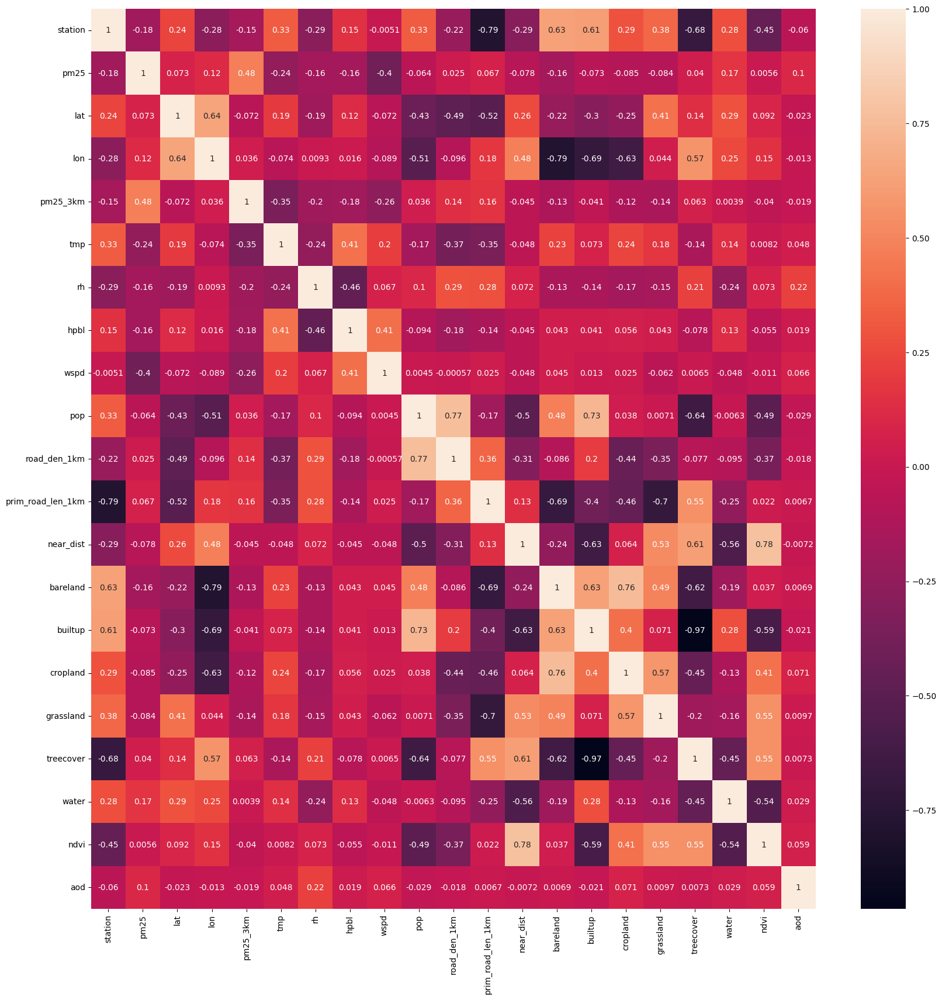

In [19]:
fig, ax = plt.subplots(figsize=(20, 20))
sns.heatmap(df_aod_raw.corr(), annot=True, ax=ax)
plt.show()

## Preprocessing

### Define label, static features and dynamic features

In [20]:
aod_label = ["pm25"]
aod_index = ["time"]
aod_stat_feats = ['lat', 'lon', 'station', 'pop', 'road_den_1km', 'prim_road_len_1km', 'near_dist', \
                  'bareland', 'builtup', 'cropland', 'grassland', 'treecover', 'water', 'ndvi']
aod_dyn_feats = list(set(df_aod_raw.columns) - set(aod_stat_feats) - set(aod_label) - set(aod_index))
aod_all_stations = sorted(df_aod_raw["station"].unique())

print(f'aod_label = {aod_label}\naod_stat_feats = {aod_stat_feats}\naod_dyn_feats = {aod_dyn_feats}\naod_all_stations = {aod_all_stations}')

aod_label = ['pm25']
aod_stat_feats = ['lat', 'lon', 'station', 'pop', 'road_den_1km', 'prim_road_len_1km', 'near_dist', 'bareland', 'builtup', 'cropland', 'grassland', 'treecover', 'water', 'ndvi']
aod_dyn_feats = ['hpbl', 'pm25_3km', 'tmp', 'wspd', 'aod', 'rh']
aod_all_stations = [np.int64(201), np.int64(202), np.int64(211), np.int64(212), np.int64(213), np.int64(214), np.int64(215), np.int64(216)]


### Fill "aod" column


Handling for station 201



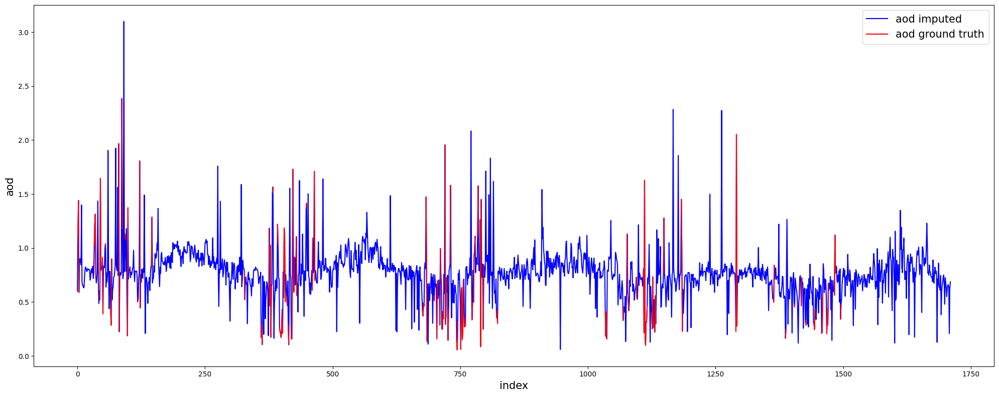


Handling for station 202



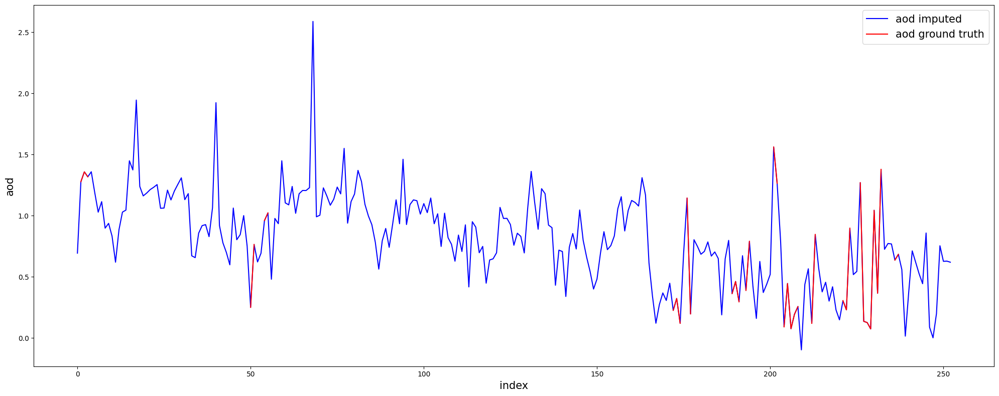


Handling for station 211



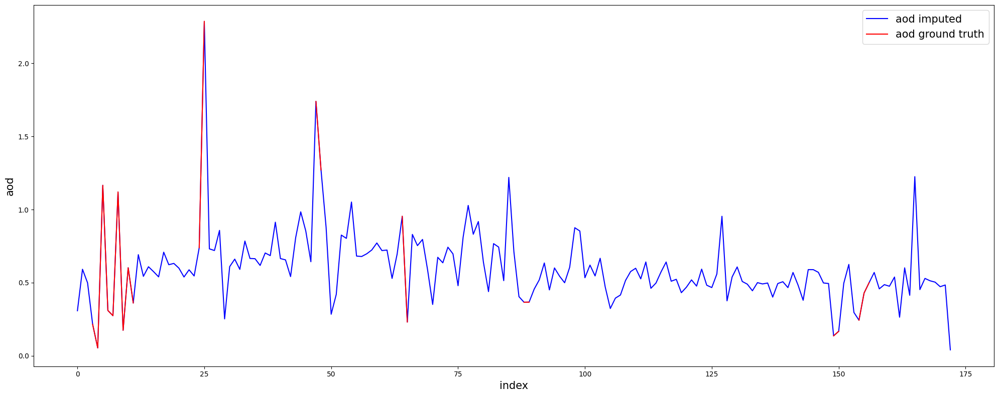


Handling for station 212



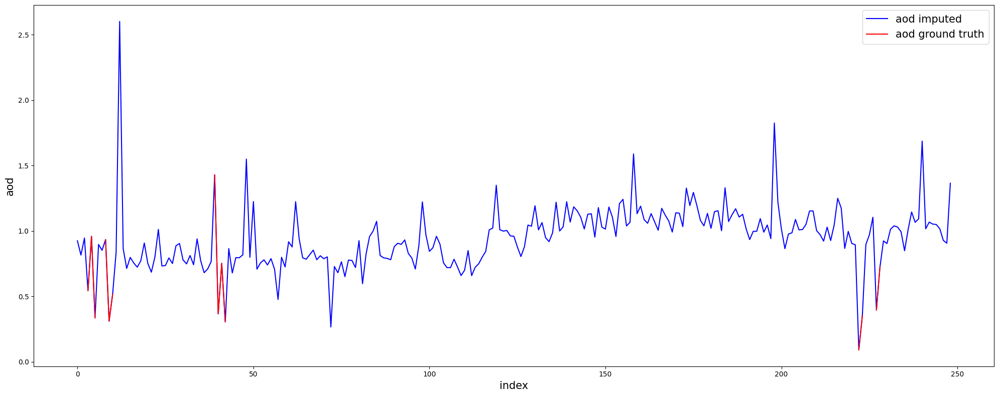


Handling for station 213



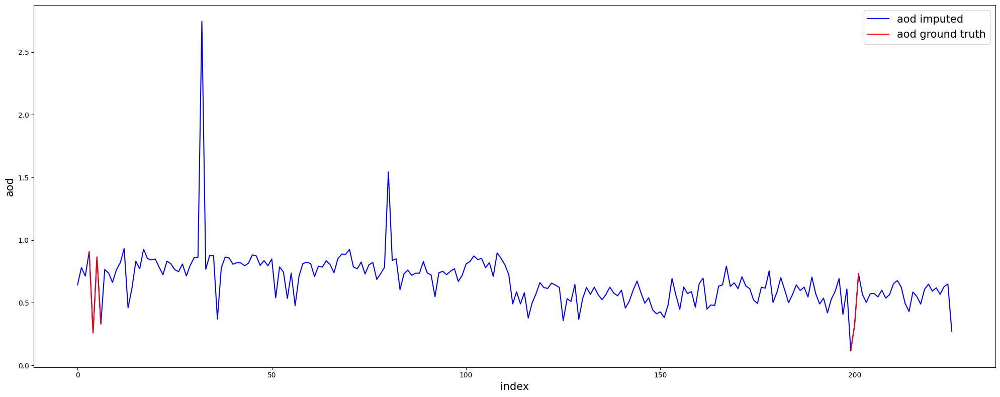


Handling for station 214



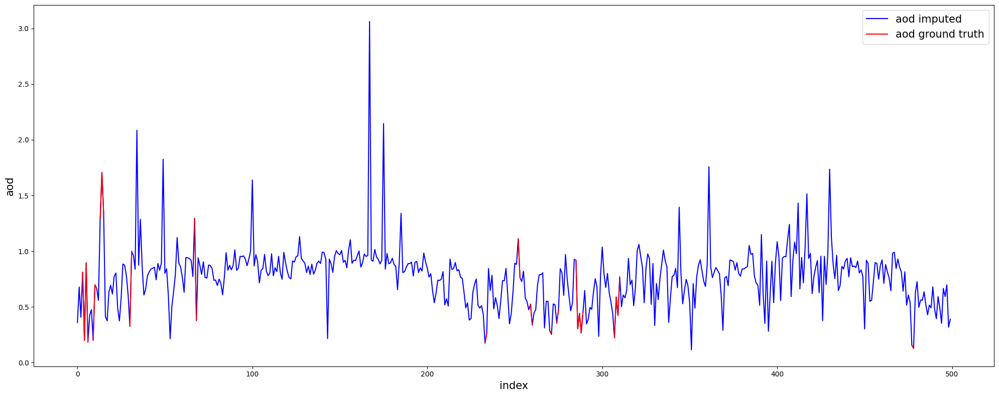


Handling for station 215



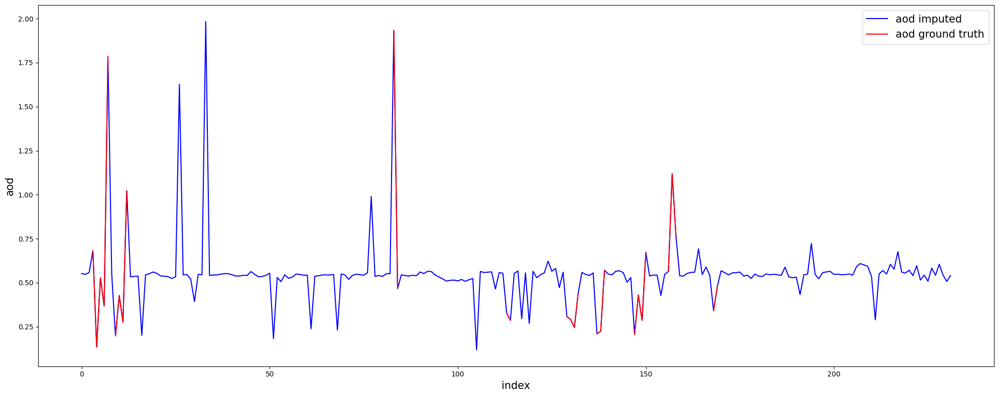


Handling for station 216



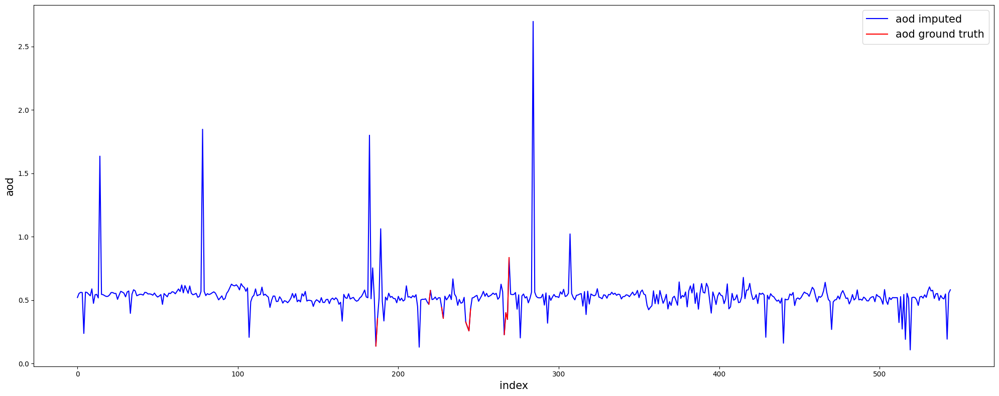

,station,pm25,lat,lon,pm25_3km,tmp,rh,hpbl,wspd,pop,...,prim_road_len_1km,near_dist,bareland,builtup,cropland,grassland,treecover,water,ndvi,aod
time,,,,,,,,,,,,,,,,,,,,,
2018-01-01,201,31.391304,10.783057,106.700606,34.919998,25.204139,70.056728,455.131335,2.352895,20680.62695,...,6885.987305,18.537305,296.31157,764977.7039,0.0,1876.639945,232011.95950,0.0,2700.122924,0.599173
2018-01-02,201,37.458333,10.783057,106.700606,51.830002,24.726431,73.425826,339.083720,1.903761,20680.62695,...,6885.987305,18.537305,296.31157,764977.7039,0.0,1876.639945,232011.95950,0.0,2700.122924,1.110117
2018-01-03,201,68.083333,10.783057,106.700606,38.240002,26.095087,77.793432,367.190738,1.293329,20680.62695,...,6885.987305,18.537305,296.31157,764977.7039,0.0,1876.639945,232011.95950,0.0,2700.122924,1.439045
2018-01-04,201,51.260870,10.783057,106.700606,40.259998,26.514926,82.982475,462.504210,1.588872,20680.62695,...,6885.987305,18.537305,296.31157,764977.7039,0.0,1876.639945,232011.95950,0.0,2700.122924,0.588595
2018-01-05,201,18.909091,10.783057,106.700606,21.690001,25.483535,93.046504,324.735356,2.505876,20680.62695,...,6885.987305,18.537305,296.31157,764977.7039,0.0,1876.639945,232011.95950,0.0,2700.122924,0.852506
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-27,216,39.659816,10.780482,106.659511,34.439411,24.136936,73.973083,457.798645,2.002987,57523.91406,...,2345.868408,6.057246,10370.90496,885181.4309,0.0,8099.182920,95807.40771,0.0,1879.344348,0.508564
2022-12-28,216,44.679352,10.780482,106.659511,29.838476,25.844296,65.530487,644.974548,2.298220,57523.91406,...,2345.868408,6.057246,10370.90496,885181.4309,0.0,8099.182920,95807.40771,0.0,1879.344348,0.547594
2022-12-29,216,30.724708,10.780482,106.659511,28.450829,25.841156,67.093735,825.517395,2.823764,57523.91406,...,2345.868408,6.057246,10370.90496,885181.4309,0.0,8099.182920,95807.40771,0.0,1879.344348,0.191691


In [21]:
all_stations_df = []

for station in aod_all_stations:
    print(f"\nHandling for station {station}\n")
    # Get dataframe of current station
    df_aod_current_station = df_aod_raw[df_aod_raw["station"] == station]

    # Fill "aod" column
    df_aod_current_station_imputed = copy.deepcopy(df_aod_current_station)
    df_aod_current_station_imputed.loc[:, "aod"] = mice(df_aod_current_station_imputed.drop(columns=["station", "pm25"]))["aod"]
    plot_2_data(data1=df_aod_current_station_imputed["aod"],
               datalabel1="aod imputed",
               data2=df_aod_current_station["aod"],
               datalabel2="aod ground truth",
               ylabel="aod",
               xlabel="index")

    # Store file for debugging after filling missing values
    df_aod_current_station_imputed.to_csv(f"{conf['workspace']['data_by_station_dir']}/df_aod_{station}.csv", index=True)

    # Reappend the location to dataset
    all_stations_df.append(df_aod_current_station_imputed)

# Merge all stations
df_aod = pd.concat(all_stations_df)
df_aod

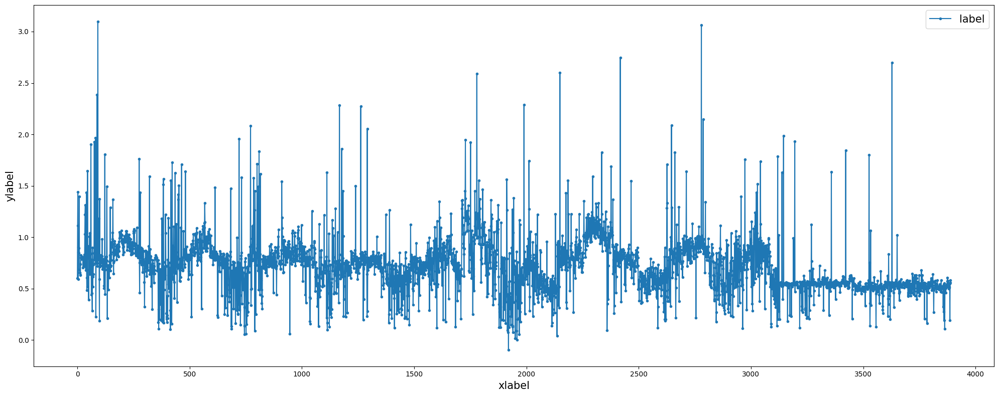

In [22]:
plot_1_data(df_aod["aod"])

In [23]:
df_aod.to_csv('df_aod.csv', index=True)

### Extract columns: time, stations, pm25_3km

In [24]:
# Get the time indices
aod_time_indices = df_aod.index
aod_time_indices

DatetimeIndex(['2018-01-01', '2018-01-02', '2018-01-03', '2018-01-04',
               '2018-01-05', '2018-01-06', '2018-01-07', '2018-01-08',
               '2018-01-09', '2018-01-10',
               ...
               '2022-12-22', '2022-12-23', '2022-12-24', '2022-12-25',
               '2022-12-26', '2022-12-27', '2022-12-28', '2022-12-29',
               '2022-12-30', '2022-12-31'],
              dtype='datetime64[ns]', name='time', length=3889, freq=None)

In [25]:
# Get the station column
aod_station_column = df_aod.loc[:, "station"]
aod_station_column

time
2018-01-01    201
2018-01-02    201
2018-01-03    201
2018-01-04    201
2018-01-05    201
             ... 
2022-12-27    216
2022-12-28    216
2022-12-29    216
2022-12-30    216
2022-12-31    216
Name: station, Length: 3889, dtype: int64

In [26]:
# Get the pm25_3km column
aod_pm25_3km_column = df_aod.loc[:, "pm25_3km"]
aod_pm25_3km_column

time
2018-01-01    34.919998
2018-01-02    51.830002
2018-01-03    38.240002
2018-01-04    40.259998
2018-01-05    21.690001
                ...    
2022-12-27    34.439411
2022-12-28    29.838476
2022-12-29    28.450829
2022-12-30    19.854403
2022-12-31    27.658358
Name: pm25_3km, Length: 3889, dtype: float64

### Split into features and labels
* Label: pm25
* Features: other columns
    * Dynamic features
    * Static features

In [27]:
# Features with pm25_3km
aod_feats = aod_stat_feats + aod_dyn_feats

# Predict without "station" as a feature
# Remove "pm25_3km" also
aod_feats.remove("station")
aod_feats.remove("pm25_3km")
X_aod = df_aod.loc[:, aod_feats]

# Label
y_aod = df_aod.loc[:, aod_label]

In [28]:
X_aod

,lat,lon,pop,road_den_1km,prim_road_len_1km,near_dist,bareland,builtup,cropland,grassland,treecover,water,ndvi,hpbl,tmp,wspd,aod,rh
time,,,,,,,,,,,,,,,,,,
2018-01-01,10.783057,106.700606,20680.62695,27.462461,6885.987305,18.537305,296.31157,764977.7039,0.0,1876.639945,232011.95950,0.0,2700.122924,455.131335,25.204139,2.352895,0.599173,70.056728
2018-01-02,10.783057,106.700606,20680.62695,27.462461,6885.987305,18.537305,296.31157,764977.7039,0.0,1876.639945,232011.95950,0.0,2700.122924,339.083720,24.726431,1.903761,1.110117,73.425826
2018-01-03,10.783057,106.700606,20680.62695,27.462461,6885.987305,18.537305,296.31157,764977.7039,0.0,1876.639945,232011.95950,0.0,2700.122924,367.190738,26.095087,1.293329,1.439045,77.793432
2018-01-04,10.783057,106.700606,20680.62695,27.462461,6885.987305,18.537305,296.31157,764977.7039,0.0,1876.639945,232011.95950,0.0,2700.122924,462.504210,26.514926,1.588872,0.588595,82.982475
2018-01-05,10.783057,106.700606,20680.62695,27.462461,6885.987305,18.537305,296.31157,764977.7039,0.0,1876.639945,232011.95950,0.0,2700.122924,324.735356,25.483535,2.505876,0.852506,93.046504
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-27,10.780482,106.659511,57523.91406,33.629780,2345.868408,6.057246,10370.90496,885181.4309,0.0,8099.182920,95807.40771,0.0,1879.344348,457.798645,24.136936,2.002987,0.508564,73.973083
2022-12-28,10.780482,106.659511,57523.91406,33.629780,2345.868408,6.057246,10370.90496,885181.4309,0.0,8099.182920,95807.40771,0.0,1879.344348,644.974548,25.844296,2.298220,0.547594,65.530487
2022-12-29,10.780482,106.659511,57523.91406,33.629780,2345.868408,6.057246,10370.90496,885181.4309,0.0,8099.182920,95807.40771,0.0,1879.344348,825.517395,25.841156,2.823764,0.191691,67.093735


In [29]:
y_aod

,pm25
time,
2018-01-01,31.391304
2018-01-02,37.458333
2018-01-03,68.083333
2018-01-04,51.260870
2018-01-05,18.909091
...,...
2022-12-27,39.659816
2022-12-28,44.679352
2022-12-29,30.724708


### Data normalization

In [30]:
# Scaled features
aod_features_scaler = MinMaxScaler()
X_aod_scaled = aod_features_scaler.fit_transform(X_aod)
X_aod_scaled = pd.DataFrame(X_aod_scaled, columns=X_aod.columns)
X_aod_scaled

,lat,lon,pop,road_den_1km,prim_road_len_1km,near_dist,bareland,builtup,cropland,grassland,treecover,water,ndvi,hpbl,tmp,wspd,aod,rh
0,0.326794,0.466551,0.116512,0.471552,0.949821,0.344052,0.00000,0.182582,0.0,0.037975,1.000000,0.0,0.526821,0.300502,0.342735,0.170694,0.217912,0.468797
1,0.326794,0.466551,0.116512,0.471552,0.949821,0.344052,0.00000,0.182582,0.0,0.037975,1.000000,0.0,0.526821,0.211553,0.303640,0.110646,0.377783,0.543165
2,0.326794,0.466551,0.116512,0.471552,0.949821,0.344052,0.00000,0.182582,0.0,0.037975,1.000000,0.0,0.526821,0.233097,0.415649,0.029033,0.480703,0.639575
3,0.326794,0.466551,0.116512,0.471552,0.949821,0.344052,0.00000,0.182582,0.0,0.037975,1.000000,0.0,0.526821,0.306153,0.450008,0.068546,0.214603,0.754117
4,0.326794,0.466551,0.116512,0.471552,0.949821,0.344052,0.00000,0.182582,0.0,0.037975,1.000000,0.0,0.526821,0.200556,0.365600,0.191147,0.297179,0.976269
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3884,0.306899,0.237227,0.857395,0.785926,0.323578,0.075528,0.62963,0.720601,0.0,0.170886,0.375453,0.0,0.085003,0.302546,0.255396,0.123912,0.189562,0.555246
3885,0.306899,0.237227,0.857395,0.785926,0.323578,0.075528,0.62963,0.720601,0.0,0.170886,0.375453,0.0,0.085003,0.446013,0.395124,0.163384,0.201774,0.368885
3886,0.306899,0.237227,0.857395,0.785926,0.323578,0.075528,0.62963,0.720601,0.0,0.170886,0.375453,0.0,0.085003,0.584396,0.394867,0.233647,0.090414,0.403392
3887,0.306899,0.237227,0.857395,0.785926,0.323578,0.075528,0.62963,0.720601,0.0,0.170886,0.375453,0.0,0.085003,0.473268,0.324368,0.376650,0.203795,0.354270


In [31]:
# Scaled label
aod_label_scaler = MinMaxScaler(feature_range=(0, 1))
y_aod_scaled = aod_label_scaler.fit_transform(y_aod)
y_aod_scaled = pd.DataFrame(y_aod_scaled, columns=y_aod.columns)
y_aod_scaled

,pm25
0,0.325673
1,0.398696
2,0.767302
3,0.564825
4,0.175435
...,...
3884,0.425193
3885,0.485609
3886,0.317649
3887,0.346136


In [32]:
pd.concat((X_aod_scaled, y_aod_scaled), axis=1)\
    .set_index(aod_time_indices)\
    .to_csv(os.path.join(conf["workspace"]["data_to_store_in_hdfs_dir"], "vientham_2018_2022_before_dim_reduction.csv"))

## Dimensionality Reduction Comparation

To compare the effect of each method, we will do the following things:
* Use the pm25 as the label
* Use other columns as the input features
* Reduce the dimension of input data using above methods
* Pass the processed input data to a model (e.g. LSTM, ...)

### Evaluation board

In [33]:
evaluation_board = {'dim_reduction_method': [], 'dim_after_reduction': [], 'prediction': [], 'n_future': []} | {m: [] for m in LSTMPrediction.get_supported_metrics()}
evaluation_board

{'dim_reduction_method': [],
 'dim_after_reduction': [],
 'prediction': [],
 'n_future': [],
 'mae': [],
 'mse': [],
 'rmse': [],
 'r2': [],
 'mape': [],
 'mnbe': [],
 'r_coeff': [],
 'p_value': []}

### Model paramaters

In [34]:
#range_of_dimension = range(conf["reduction_aod"]["min_number_of_features"], X_aod_scaled.shape[1])
range_of_dimension = range(15, 16)
print(*range_of_dimension)

range_of_n_future = range(1, 4)
print(*range_of_n_future)

reduction_n_past, reduction_n_future = conf["reduction_aod"]["n_past"], conf["reduction_aod"]["n_future"]
reduction_epochs, reduction_batch_size = conf["reduction_aod"]["epochs"], conf["reduction_aod"]["batch_size"]
print(reduction_n_past, reduction_n_future, reduction_epochs, reduction_batch_size)

prediction_n_past = conf["prediction_aod"]["n_past"]
prediction_epochs, prediction_batch_size = conf["prediction_aod"]["epochs"], conf["prediction_aod"]["batch_size"]
print(prediction_n_past, prediction_epochs, prediction_batch_size)

saved_model_plot_dir = conf["workspace"]["saved_model_plot_dir"]
saved_model_weight_dir = conf["workspace"]["saved_model_weight_dir"]
print(saved_model_plot_dir, saved_model_weight_dir)

15
1 2 3
7 7 200 128
7 200 128
/le_thanh_van_118/workspace/hiep_workspace/saved_model_plot /le_thanh_van_118/workspace/hiep_workspace/saved_model_weight


### Prediction without reduction (n_future = 1 to 3)



PREDICTION WITH N_FUTURE = 1

LSTMPrediction._prepare_data(): is called


I0000 00:00:1758771947.221960 2125751 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 812 MB memory:  -> device: 0, name: NVIDIA A100-PCIE-40GB, pci bus id: 0000:b1:00.0, compute capability: 8.0


Model: "aod_LSTMPrediction_1_future"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 7, 19)     │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm (LSTM)         │ [(None, 64),      │     21,504 │ input_layer[0][0] │
│                     │ (None, 64),       │            │                   │
│                     │ (None, 64)]       │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector       │ (None, 1, 64)     │          0 │ lstm[0][0]        │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_1 (LSTM)       │ (None, 1, 64)     │     33,024 │ repeat_vector[0]… │
│                     │                   │            │ lstm[0][1],       │
│                     │                   │            │ lstm[0][2]        │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 1, 64)     │          0 │ lstm_1[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ time_distributed    │ (None, 1, 1)      │         65 │ dropout[0][0]     │
│ (TimeDistributed)   │                   │            │                   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 54,593 (213.25 KB)

 Trainable params: 54,593 (213.25 KB)

 Non-trainable params: 0 (0.00 B)

None
LSTMPrediction.execute(): is called
LSTMPrediction._train_model(): is called


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 1/200


I0000 00:00:1758771950.161938 2125832 service.cc:152] XLA service 0x7b8eec009890 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1758771950.161961 2125832 service.cc:160]   StreamExecutor device (0): NVIDIA A100-PCIE-40GB, Compute Capability 8.0
I0000 00:00:1758771950.670443 2125832 cuda_dnn.cc:529] Loaded cuDNN version 90300


16/20 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0928 

I0000 00:00:1758771956.354706 2125832 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


20/20 ━━━━━━━━━━━━━━━━━━━━ 13s 272ms/step - loss: 0.0468 - val_loss: 0.0198
Epoch 2/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0229 - val_loss: 0.0170
Epoch 3/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0203 - val_loss: 0.0145
Epoch 4/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0190 - val_loss: 0.0171
Epoch 5/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0168 - val_loss: 0.0148
Epoch 6/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0169 - val_loss: 0.0143
Epoch 7/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0155 - val_loss: 0.0152
Epoch 8/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0137 - val_loss: 0.0140
Epoch 9/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0132 - val_loss: 0.0153
Epoch 10/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0144 - val_loss: 0.0141
Epoch 11/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0126 - val_loss: 0.0140
Epoch 12/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0116 - val

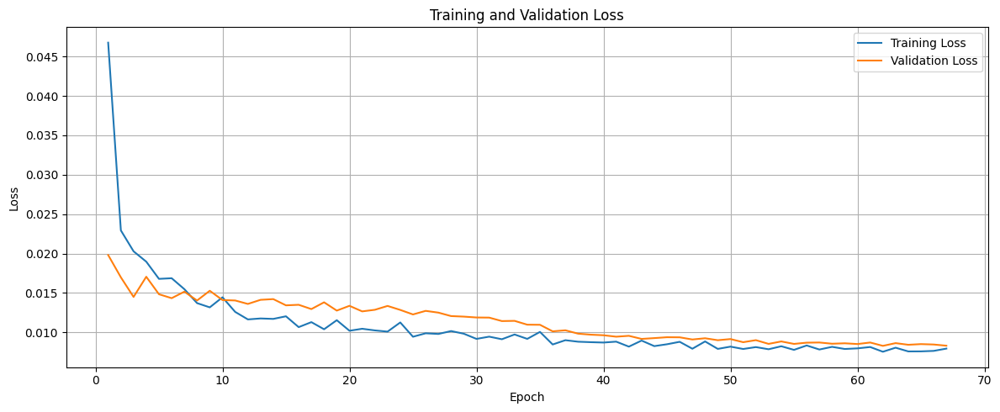

25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step 
y_pred.shape = (776, 1, 1)
y_test.shape = (776, 1, 1)
Day 1 - mae = 5.1507619079607485, mse = 43.9738415723402, r2 = -1.8698435541060592, rmse = 6.631277521891253, mape = 0.2686064140227692, mnbe = 5.777208722570021, r_coeff = [0.38635008], p_value = [4.98237117e-29]
avg_mae = 5.1507619079607485
avg_mse = 43.9738415723402
avg_r2 = -1.8698435541060592
avg_rmse = 6.631277521891253
avg_mape = 0.2686064140227692
avg_mnbe = 5.777208722570021
avg_r_coeff = 0.386350077775127
avg_p_value = 4.982371170954643e-29
inv_y_pred.shape = (776, 1)
inv_y_test.shape = (776, 1)


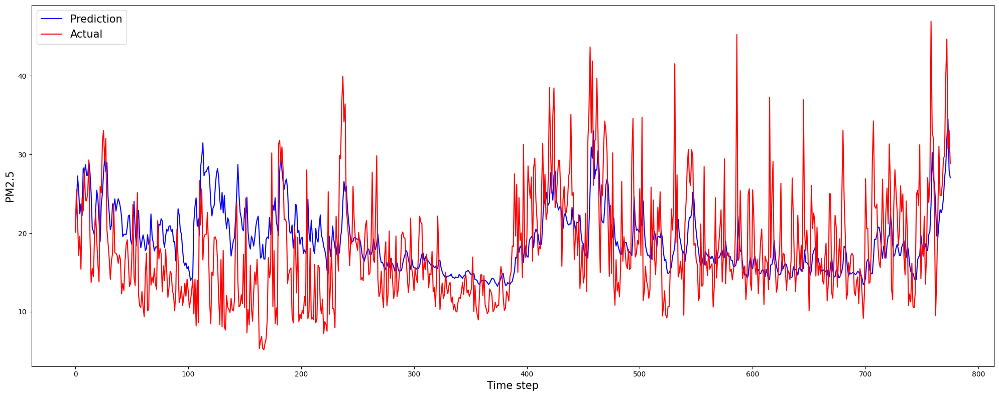



PREDICTION WITH N_FUTURE = 2

LSTMPrediction._prepare_data(): is called


Model: "aod_LSTMPrediction_2_future"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 7, 19)     │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_2 (LSTM)       │ [(None, 64),      │     21,504 │ input_layer_1[0]… │
│                     │ (None, 64),       │            │                   │
│                     │ (None, 64)]       │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_1     │ (None, 2, 64)     │          0 │ lstm_2[0][0]      │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_3 (LSTM)       │ (None, 2, 64)     │     33,024 │ repeat_vector_1[… │
│                     │                   │            │ lstm_2[0][1],     │
│                     │                   │            │ lstm_2[0][2]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_1 (Dropout) │ (None, 2, 64)     │          0 │ lstm_3[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ time_distributed_1  │ (None, 2, 1)      │         65 │ dropout_1[0][0]   │
│ (TimeDistributed)   │                   │            │                   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 54,593 (213.25 KB)

 Trainable params: 54,593 (213.25 KB)

 Non-trainable params: 0 (0.00 B)

None
LSTMPrediction.execute(): is called
LSTMPrediction._train_model(): is called


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 1/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 10s 292ms/step - loss: 0.0480 - val_loss: 0.0146
Epoch 2/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0199 - val_loss: 0.0167
Epoch 3/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0176 - val_loss: 0.0140
Epoch 4/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0170 - val_loss: 0.0131
Epoch 5/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0150 - val_loss: 0.0134
Epoch 6/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0139 - val_loss: 0.0135
Epoch 7/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0141 - val_loss: 0.0138
Epoch 8/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0141 - val_loss: 0.0157
Epoch 9/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0141 - val_loss: 0.0127
Epoch 10/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0119 - val_loss: 0.0143
Epoch 11/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0128 - val_loss: 0.0142
Epoch 12/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 

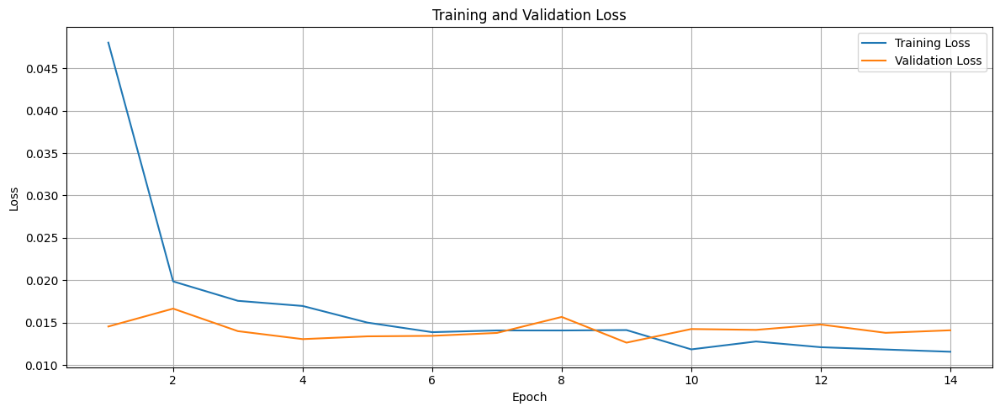

25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step 
y_pred.shape = (776, 2, 1)
y_test.shape = (776, 2, 1)
Day 1 - mae = 5.638750237991747, mse = 44.3108830975586, r2 = -4.2388781881145405, rmse = 6.656642028647672, mape = 0.2729048830030987, mnbe = 16.558882703614515, r_coeff = [0.53038284], p_value = [1.63669622e-57]
Day 2 - mae = 5.709502972299392, mse = 46.096311220684264, r2 = -3.739475248893668, rmse = 6.78942642796019, mape = 0.2777276002274808, mnbe = 15.580162099337514, r_coeff = [0.46225188], p_value = [2.44419297e-42]
avg_mae = 5.674126605145569
avg_mse = 45.20359715912143
avg_r2 = -3.9891767185041043
avg_rmse = 6.723034228303931
avg_mape = 0.2753162416152897
avg_mnbe = 16.069522401476014
avg_r_coeff = 0.4963173601631872
avg_p_value = 1.2220964843154802e-42
inv_y_pred.shape = (776, 1)
inv_y_test.shape = (776, 1)


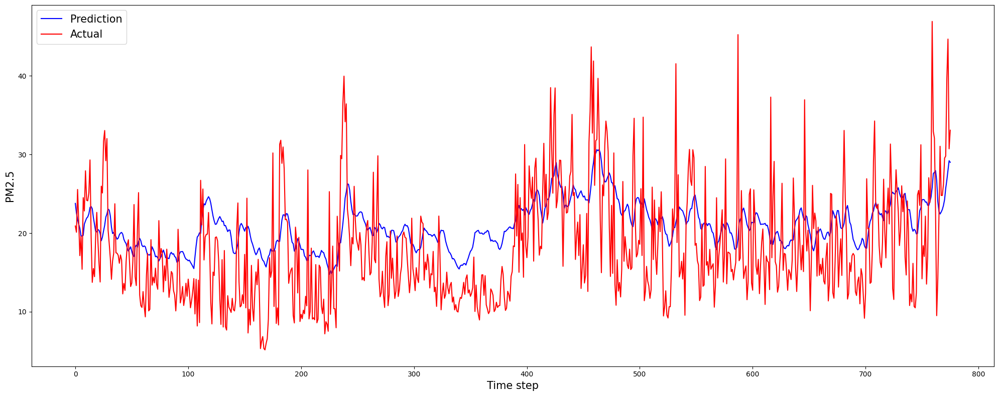

inv_y_pred.shape = (776, 1)
inv_y_test.shape = (776, 1)


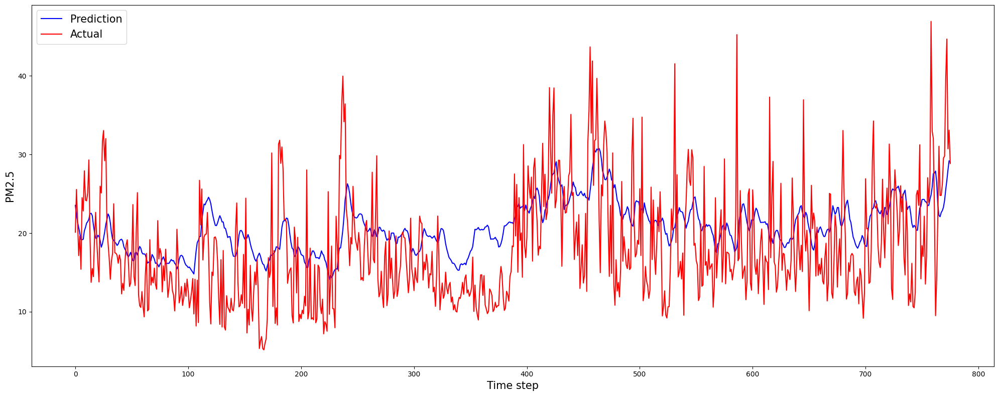



PREDICTION WITH N_FUTURE = 3

LSTMPrediction._prepare_data(): is called


Model: "aod_LSTMPrediction_3_future"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 7, 19)     │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_4 (LSTM)       │ [(None, 64),      │     21,504 │ input_layer_2[0]… │
│                     │ (None, 64),       │            │                   │
│                     │ (None, 64)]       │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_2     │ (None, 3, 64)     │          0 │ lstm_4[0][0]      │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_5 (LSTM)       │ (None, 3, 64)     │     33,024 │ repeat_vector_2[… │
│                     │                   │            │ lstm_4[0][1],     │
│                     │                   │            │ lstm_4[0][2]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_2 (Dropout) │ (None, 3, 64)     │          0 │ lstm_5[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ time_distributed_2  │ (None, 3, 1)      │         65 │ dropout_2[0][0]   │
│ (TimeDistributed)   │                   │            │                   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 54,593 (213.25 KB)

 Trainable params: 54,593 (213.25 KB)

 Non-trainable params: 0 (0.00 B)

None
LSTMPrediction.execute(): is called
LSTMPrediction._train_model(): is called


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 1/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 10s 285ms/step - loss: 0.0319 - val_loss: 0.0149
Epoch 2/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0177 - val_loss: 0.0148
Epoch 3/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0165 - val_loss: 0.0138
Epoch 4/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0155 - val_loss: 0.0135
Epoch 5/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0147 - val_loss: 0.0122
Epoch 6/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0144 - val_loss: 0.0115
Epoch 7/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0137 - val_loss: 0.0127
Epoch 8/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0130 - val_loss: 0.0101
Epoch 9/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0159 - val_loss: 0.0110
Epoch 10/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0153 - val_loss: 0.0113
Epoch 11/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0130 - val_loss: 0.0123
Epoch 12/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 

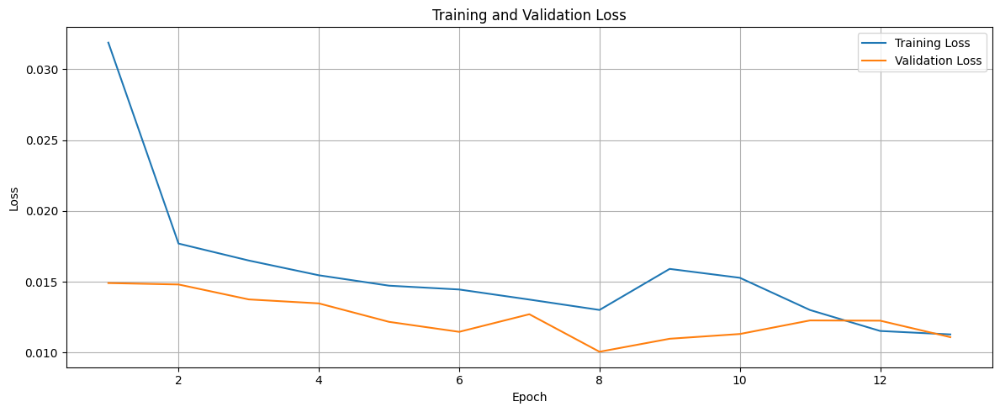

25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step 
y_pred.shape = (776, 3, 1)
y_test.shape = (776, 3, 1)
Day 1 - mae = 6.419290836891059, mse = 54.58006276198598, r2 = -6.039536953289056, rmse = 7.387832074565988, mape = 0.2934482182488577, mnbe = 23.841961764992103, r_coeff = [0.51088548], p_value = [8.16639467e-53]
Day 2 - mae = 5.670412002933033, mse = 45.332722657501115, r2 = -3.810953302894485, rmse = 6.7329579426505495, mape = 0.2782124100700967, mnbe = 14.838436612092309, r_coeff = [0.46060191], p_value = [5.18585764e-42]
Day 3 - mae = 5.2582157997343915, mse = 41.812138545450146, r2 = -2.962651400774944, rmse = 6.466230628847857, mape = 0.2756055787377157, mnbe = 7.552683503339922, r_coeff = [0.42479698], p_value = [2.39847802e-35]
avg_mae = 5.782639546519494
avg_mse = 47.241641321645744
avg_r2 = -4.271047218986162
avg_rmse = 6.8623402153547985
avg_mape = 0.28242206901889005
avg_mnbe = 15.41102729347478
avg_r_coeff = 0.4654281213150438
avg_p_value = 7.994928445673187e-36
inv_y_pred.shape

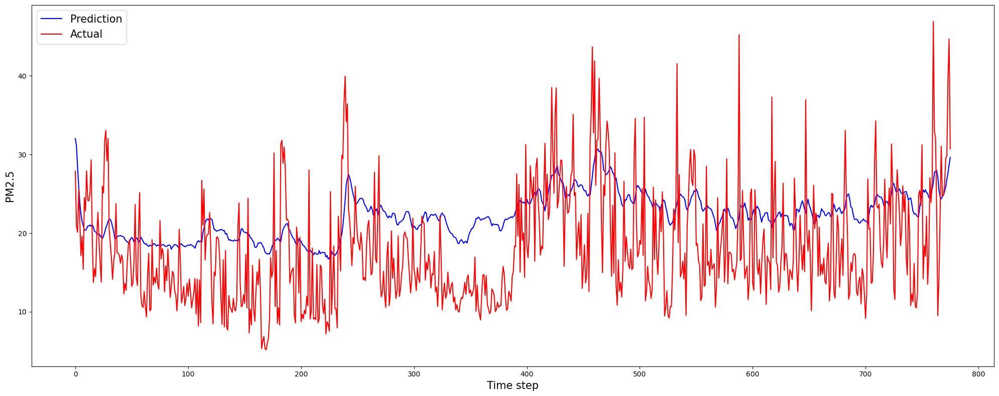

inv_y_pred.shape = (776, 1)
inv_y_test.shape = (776, 1)


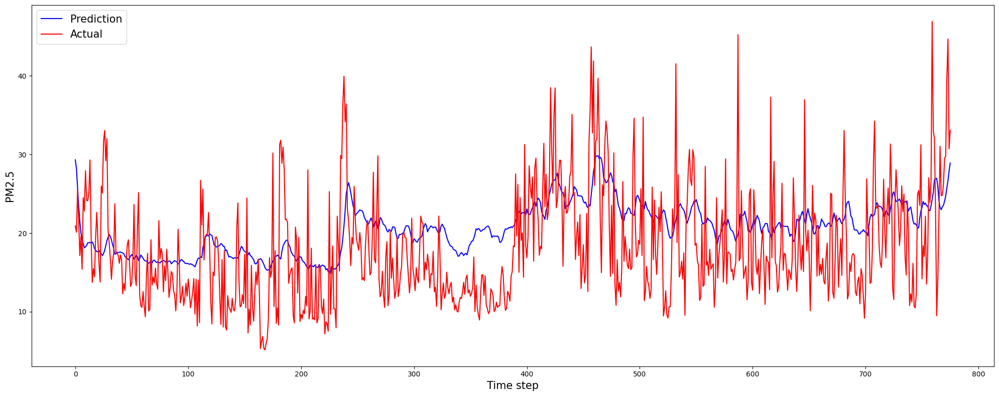

inv_y_pred.shape = (776, 1)
inv_y_test.shape = (776, 1)


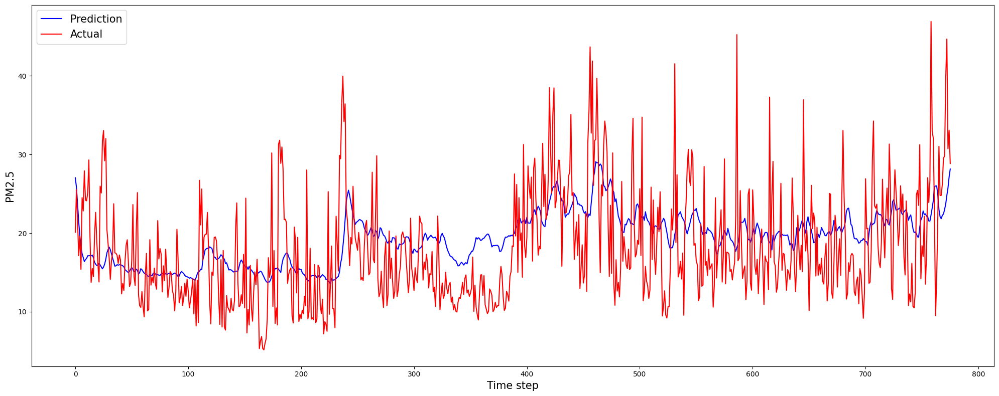

,dim_reduction_method,dim_after_reduction,prediction,n_future,mae,mse,rmse,r2,mape,mnbe,r_coeff,p_value
0,None,N/A,LSTM,1,5.150762,43.973842,6.631278,-1.869844,0.268606,5.777209,0.386350,4.982371e-29
1,None,N/A,LSTM,2,5.674127,45.203597,6.723034,-3.989177,0.275316,16.069522,0.496317,1.222096e-42
2,None,N/A,LSTM,3,5.782640,47.241641,6.862340,-4.271047,0.282422,15.411027,0.465428,7.994928e-36


In [35]:
# Loop every n_future
for prediction_n_future in range(1, 4):
    print("\n" + "=" * 100 + "\n")
    print(f"PREDICTION WITH N_FUTURE = {prediction_n_future}\n")
    lstmpred = LSTMPrediction(X_aod_scaled, y_aod_scaled,
                                aod_label_scaler,
                                val_percentage=0.2, test_percentage=0.2,
                                n_past=prediction_n_past, n_future=prediction_n_future,
                                epochs=prediction_epochs, batch_size=prediction_batch_size,
                                verbose=1,
                                model_name=f"aod_{LSTMPrediction.class_name}_{prediction_n_future}_future")
    lstmpred.dump(saved_model_plot_dir)
    all_days_inv_y_pred, all_days_inv_y_test, metrics, _ = lstmpred.execute(saved_model_weight_dir)
    
    # Visualize the prediction
    plot_prediction(all_days_inv_y_pred, all_days_inv_y_test, prediction_n_future)
    
    # Print out the evaluation board
    evaluation_board['dim_reduction_method'] += ["None"]
    evaluation_board['dim_after_reduction'] += ["N/A"]
    evaluation_board['prediction'] += ["LSTM"]
    evaluation_board['n_future'] += [prediction_n_future]
    for m in LSTMPrediction.get_supported_metrics():
        evaluation_board[m] += [metrics[m][1]]

# Show evaluation board
pd.DataFrame(evaluation_board)

### Prediction + LSTM-Seq2Seq (n_future = 1 to 3)

#### Doing the loop



PREDICTION WITH N_FUTURE = 1

LSTMSeq2SeqReduction._prepare_data(): is called
LSTMSeq2SeqReduction._define_model(): is called
LSTMSeq2SeqReduction.execute(): is called
LSTMSeq2SeqReduction._train_model(): is called


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 1/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 11s 264ms/step - loss: 0.1930 - val_loss: 0.1107
Epoch 2/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0893 - val_loss: 0.0876
Epoch 3/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0648 - val_loss: 0.0860
Epoch 4/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0557 - val_loss: 0.0776
Epoch 5/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0927 - val_loss: 0.0938
Epoch 6/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0662 - val_loss: 0.0858
Epoch 7/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0553 - val_loss: 0.0801
Epoch 8/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0465 - val_loss: 0.0740
Epoch 9/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0425 - val_loss: 0.0780
Epoch 10/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0437 - val_loss: 0.0672
Epoch 11/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0449 - val_loss: 0.0722
Epoch 12/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/st

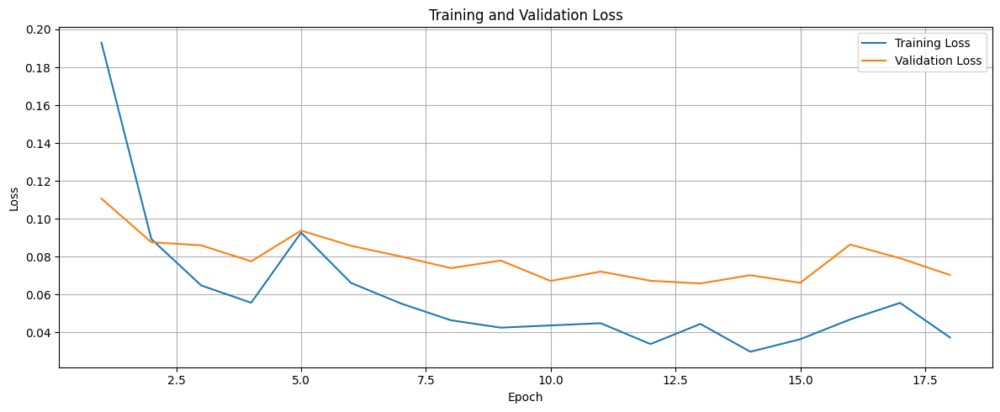

25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step 
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0706
LSTMSeq2SeqReduction.execute(): mae = 0.0706271156668663
LSTMSeq2SeqReduction._define_encoder_model(): is called
LSTMSeq2SeqReduction._encode_data(): is called
122/122 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step


Model: "aod_LSTMSeq2SeqReduction_15_features"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3       │ (None, 7, 18)     │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_6 (LSTM)       │ (None, 7, 100)    │     47,600 │ input_layer_3[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_7 (LSTM)       │ [(None, 50),      │     30,200 │ lstm_6[0][0]      │
│                     │ (None, 50),       │            │                   │
│                     │ (None, 50)]       │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_3 (Dense)     │ (None, 15)        │        765 │ lstm_7[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_3     │ (None, 7, 15)     │          0 │ dense_3[0][0]     │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_8 (LSTM)       │ (None, 7, 50)     │     13,200 │ repeat_vector_3[… │
│                     │                   │            │ lstm_7[0][1],     │
│                     │                   │            │ lstm_7[0][2]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_9 (LSTM)       │ (None, 7, 100)    │     60,400 │ lstm_8[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ time_distributed_3  │ (None, 7, 18)     │      1,818 │ lstm_9[0][0]      │
│ (TimeDistributed)   │                   │            │                   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 461,951 (1.76 MB)

 Trainable params: 153,983 (601.50 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 307,968 (1.17 MB)

None


Model: "aod_LSTMSeq2SeqReduction_15_features_encoder"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_4 (InputLayer)      │ (None, 7, 18)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_6 (LSTM)                   │ (None, 7, 100)         │        47,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_7 (LSTM)                   │ [(None, 50), (None,    │        30,200 │
│                                 │ 50), (None, 50)]       │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 15)             │           765 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 78,565 (306.89 KB)

 Trainable params: 78,565 (306.89 KB)

 Non-trainable params: 0 (0.00 B)

None
LSTMPrediction._prepare_data(): is called


Model: "aod_LSTMPrediction_1_future_with_LSTMSeq2SeqReduction_15_features"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_5       │ (None, 7, 16)     │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_10 (LSTM)      │ [(None, 64),      │     20,736 │ input_layer_5[0]… │
│                     │ (None, 64),       │            │                   │
│                     │ (None, 64)]       │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_4     │ (None, 1, 64)     │          0 │ lstm_10[0][0]     │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_11 (LSTM)      │ (None, 1, 64)     │     33,024 │ repeat_vector_4[… │
│                     │                   │            │ lstm_10[0][1],    │
│                     │                   │            │ lstm_10[0][2]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_3 (Dropout) │ (None, 1, 64)     │          0 │ lstm_11[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ time_distributed_4  │ (None, 1, 1)      │         65 │ dropout_3[0][0]   │
│ (TimeDistributed)   │                   │            │                   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 53,825 (210.25 KB)

 Trainable params: 53,825 (210.25 KB)

 Non-trainable params: 0 (0.00 B)

None
LSTMPrediction.execute(): is called
LSTMPrediction._train_model(): is called


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 1/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 11s 214ms/step - loss: 0.0401 - val_loss: 0.0186
Epoch 2/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0197 - val_loss: 0.0144
Epoch 3/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0178 - val_loss: 0.0146
Epoch 4/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0173 - val_loss: 0.0131
Epoch 5/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0157 - val_loss: 0.0126
Epoch 6/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0152 - val_loss: 0.0125
Epoch 7/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0148 - val_loss: 0.0119
Epoch 8/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0144 - val_loss: 0.0113
Epoch 9/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0132 - val_loss: 0.0108
Epoch 10/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0127 - val_loss: 0.0104
Epoch 11/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0129 - val_loss: 0.0111
Epoch 12/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 

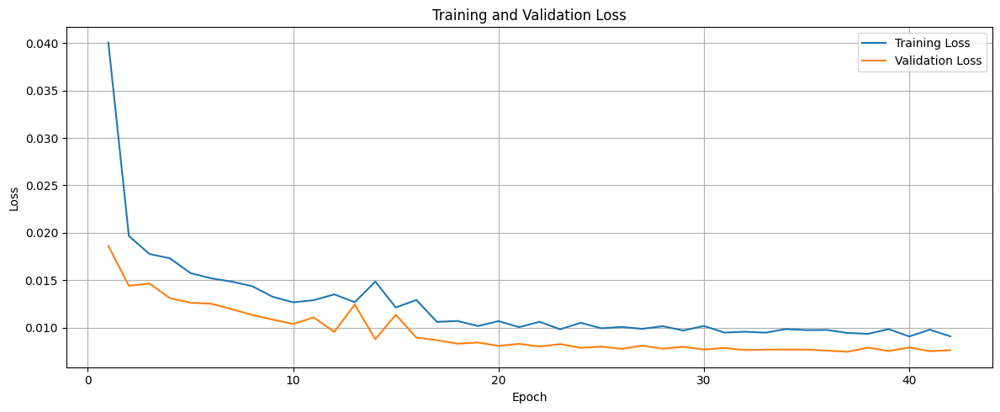

25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step 
y_pred.shape = (776, 1, 1)
y_test.shape = (776, 1, 1)
Day 1 - mae = 4.865621911838545, mse = 35.08568684781936, r2 = -2.1389132770743315, rmse = 5.9233172165450805, mape = 0.25199329385829067, mnbe = 9.266049118160494, r_coeff = [0.59018698], p_value = [5.20638949e-74]
avg_mae = 4.865621911838545
avg_mse = 35.08568684781936
avg_r2 = -2.1389132770743315
avg_rmse = 5.9233172165450805
avg_mape = 0.25199329385829067
avg_mnbe = 9.266049118160494
avg_r_coeff = 0.5901869767696604
avg_p_value = 5.2063894882340576e-74
Choosing the best result

dict_keys([15])
N = 15
mae = 4.865621911838545
mse = 35.08568684781936
rmse = 5.9233172165450805
r2 = -2.1389132770743315
mape = 0.25199329385829067
mnbe = 9.266049118160494
r_coeff = 0.5901869767696604
p_value = 5.2063894882340576e-74


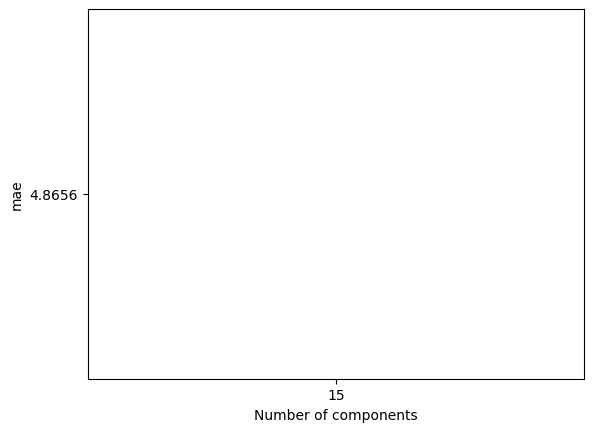

inv_y_pred.shape = (776, 1)
inv_y_test.shape = (776, 1)


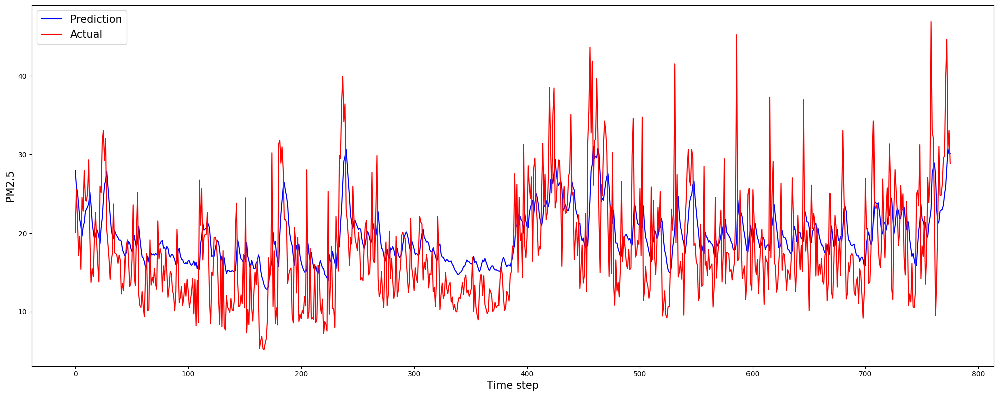

,dim_reduction_method,dim_after_reduction,prediction,n_future,mae,mse,rmse,r2,mape,mnbe,r_coeff,p_value
0,None,N/A,LSTM,1,5.150762,43.973842,6.631278,-1.869844,0.268606,5.777209,0.386350,4.982371e-29
1,None,N/A,LSTM,2,5.674127,45.203597,6.723034,-3.989177,0.275316,16.069522,0.496317,1.222096e-42
2,None,N/A,LSTM,3,5.782640,47.241641,6.862340,-4.271047,0.282422,15.411027,0.465428,7.994928e-36
3,LSTM-Seq2Seq,15,LSTM,1,4.865622,35.085687,5.923317,-2.138913,0.251993,9.266049,0.590187,5.206389e-74




PREDICTION WITH N_FUTURE = 2

LSTMSeq2SeqReduction._prepare_data(): is called
LSTMSeq2SeqReduction._define_model(): is called
LSTMSeq2SeqReduction.execute(): is called
LSTMSeq2SeqReduction._train_model(): is called


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 1/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 11s 265ms/step - loss: 0.1809 - val_loss: 0.0983
Epoch 2/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0887 - val_loss: 0.0925
Epoch 3/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0689 - val_loss: 0.0843
Epoch 4/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0597 - val_loss: 0.0854
Epoch 5/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0643 - val_loss: 0.0853
Epoch 6/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0619 - val_loss: 0.0804
Epoch 7/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0433 - val_loss: 0.0683
Epoch 8/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0784 - val_loss: 0.0750
Epoch 9/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0533 - val_loss: 0.0844
Epoch 10/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0426 - val_loss: 0.0771
Epoch 11/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0464 - val_loss: 0.0764
Epoch 12/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/st

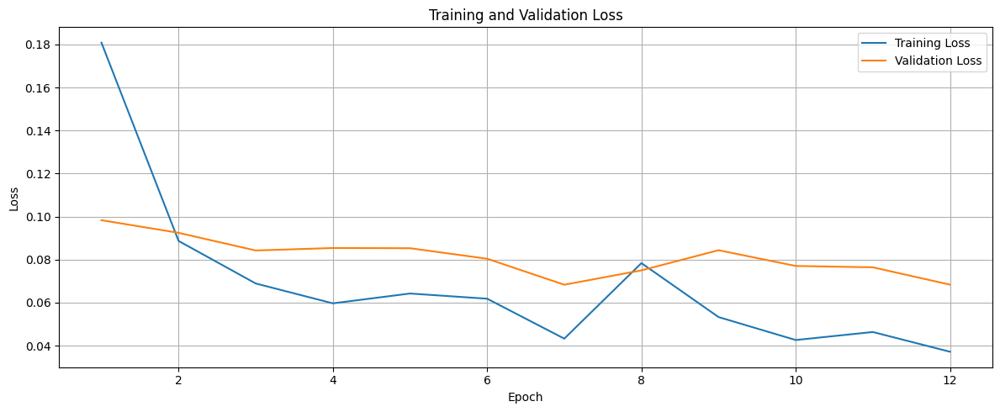

25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step 
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0700
LSTMSeq2SeqReduction.execute(): mae = 0.07003955543041229
LSTMSeq2SeqReduction._define_encoder_model(): is called
LSTMSeq2SeqReduction._encode_data(): is called
122/122 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step


Model: "aod_LSTMSeq2SeqReduction_15_features"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_6       │ (None, 7, 18)     │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_12 (LSTM)      │ (None, 7, 100)    │     47,600 │ input_layer_6[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_13 (LSTM)      │ [(None, 50),      │     30,200 │ lstm_12[0][0]     │
│                     │ (None, 50),       │            │                   │
│                     │ (None, 50)]       │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_6 (Dense)     │ (None, 15)        │        765 │ lstm_13[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_5     │ (None, 7, 15)     │          0 │ dense_6[0][0]     │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_14 (LSTM)      │ (None, 7, 50)     │     13,200 │ repeat_vector_5[… │
│                     │                   │            │ lstm_13[0][1],    │
│                     │                   │            │ lstm_13[0][2]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_15 (LSTM)      │ (None, 7, 100)    │     60,400 │ lstm_14[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ time_distributed_5  │ (None, 7, 18)     │      1,818 │ lstm_15[0][0]     │
│ (TimeDistributed)   │                   │            │                   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 461,951 (1.76 MB)

 Trainable params: 153,983 (601.50 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 307,968 (1.17 MB)

None


Model: "aod_LSTMSeq2SeqReduction_15_features_encoder"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_7 (InputLayer)      │ (None, 7, 18)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_12 (LSTM)                  │ (None, 7, 100)         │        47,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_13 (LSTM)                  │ [(None, 50), (None,    │        30,200 │
│                                 │ 50), (None, 50)]       │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 15)             │           765 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 78,565 (306.89 KB)

 Trainable params: 78,565 (306.89 KB)

 Non-trainable params: 0 (0.00 B)

None
LSTMPrediction._prepare_data(): is called


Model: "aod_LSTMPrediction_2_future_with_LSTMSeq2SeqReduction_15_features"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_8       │ (None, 7, 16)     │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_16 (LSTM)      │ [(None, 64),      │     20,736 │ input_layer_8[0]… │
│                     │ (None, 64),       │            │                   │
│                     │ (None, 64)]       │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_6     │ (None, 2, 64)     │          0 │ lstm_16[0][0]     │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_17 (LSTM)      │ (None, 2, 64)     │     33,024 │ repeat_vector_6[… │
│                     │                   │            │ lstm_16[0][1],    │
│                     │                   │            │ lstm_16[0][2]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_4 (Dropout) │ (None, 2, 64)     │          0 │ lstm_17[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ time_distributed_6  │ (None, 2, 1)      │         65 │ dropout_4[0][0]   │
│ (TimeDistributed)   │                   │            │                   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 53,825 (210.25 KB)

 Trainable params: 53,825 (210.25 KB)

 Non-trainable params: 0 (0.00 B)

None
LSTMPrediction.execute(): is called
LSTMPrediction._train_model(): is called


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 1/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 9s 237ms/step - loss: 0.0378 - val_loss: 0.0204
Epoch 2/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0306 - val_loss: 0.0217
Epoch 3/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0223 - val_loss: 0.0199
Epoch 4/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0202 - val_loss: 0.0175
Epoch 5/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0180 - val_loss: 0.0165
Epoch 6/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0179 - val_loss: 0.0163
Epoch 7/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0177 - val_loss: 0.0158
Epoch 8/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0175 - val_loss: 0.0151
Epoch 9/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0159 - val_loss: 0.0146
Epoch 10/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0158 - val_loss: 0.0143
Epoch 11/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0156 - val_loss: 0.0138
Epoch 12/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0

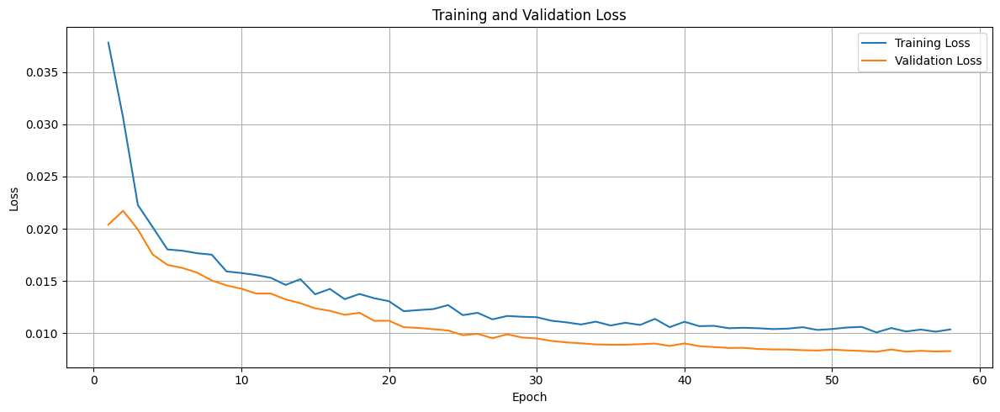

25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step 
y_pred.shape = (776, 2, 1)
y_test.shape = (776, 2, 1)
Day 1 - mae = 4.587520094779132, mse = 33.653762350783964, r2 = -2.3289035078481697, rmse = 5.80118628823312, mape = 0.2467689892463835, mnbe = 4.513164833859232, r_coeff = [0.57893984], p_value = [1.20881913e-70]
Day 2 - mae = 5.027780336620869, mse = 39.0545719009477, r2 = -2.6875486794109578, rmse = 6.249365719890916, mape = 0.26431219336925077, mnbe = 6.981261483524415, r_coeff = [0.47971517], p_value = [6.58959535e-46]
avg_mae = 4.807650215700001
avg_mse = 36.35416712586583
avg_r2 = -2.5082260936295637
avg_rmse = 6.025276004062018
avg_mape = 0.25554059130781714
avg_mnbe = 5.747213158691824
avg_r_coeff = 0.5293275014802584
avg_p_value = 3.2947976732859516e-46
Choosing the best result

dict_keys([15])
N = 15
mae = 4.807650215700001
mse = 36.35416712586583
rmse = 6.025276004062018
r2 = -2.5082260936295637
mape = 0.25554059130781714
mnbe = 5.747213158691824
r_coeff = 0.5293275014802584
p_val

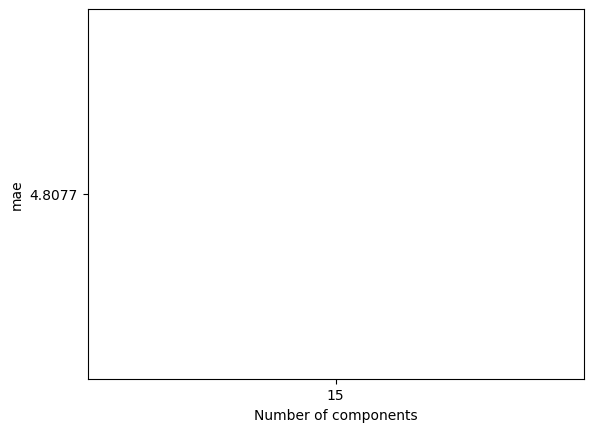

inv_y_pred.shape = (776, 1)
inv_y_test.shape = (776, 1)


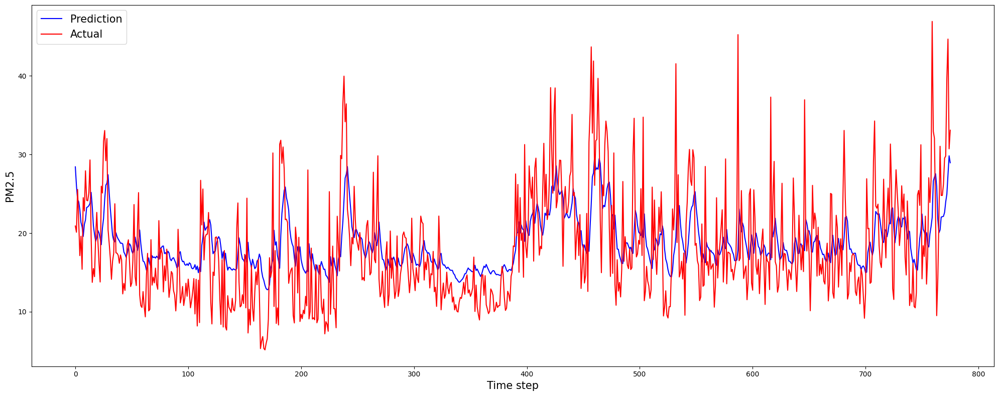

inv_y_pred.shape = (776, 1)
inv_y_test.shape = (776, 1)


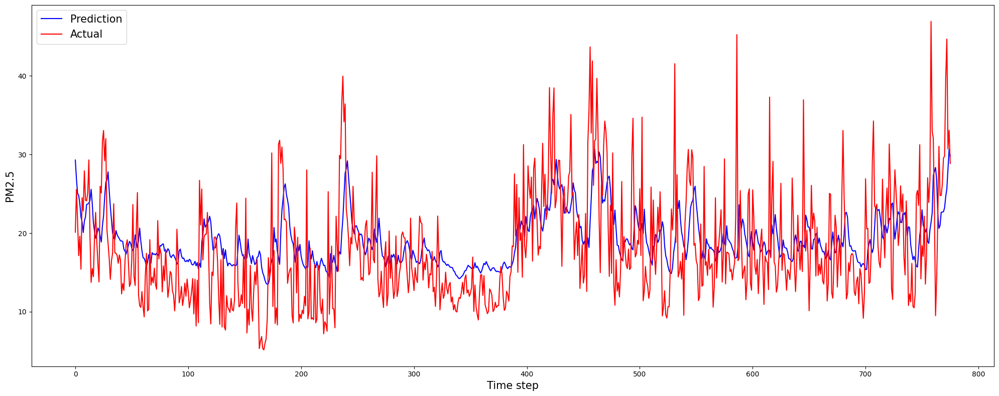

,dim_reduction_method,dim_after_reduction,prediction,n_future,mae,mse,rmse,r2,mape,mnbe,r_coeff,p_value
0,None,N/A,LSTM,1,5.150762,43.973842,6.631278,-1.869844,0.268606,5.777209,0.386350,4.982371e-29
1,None,N/A,LSTM,2,5.674127,45.203597,6.723034,-3.989177,0.275316,16.069522,0.496317,1.222096e-42
2,None,N/A,LSTM,3,5.782640,47.241641,6.862340,-4.271047,0.282422,15.411027,0.465428,7.994928e-36
3,LSTM-Seq2Seq,15,LSTM,1,4.865622,35.085687,5.923317,-2.138913,0.251993,9.266049,0.590187,5.206389e-74
4,LSTM-Seq2Seq,15,LSTM,2,4.807650,36.354167,6.025276,-2.508226,0.255541,5.747213,0.529328,3.294798e-46




PREDICTION WITH N_FUTURE = 3

LSTMSeq2SeqReduction._prepare_data(): is called
LSTMSeq2SeqReduction._define_model(): is called
LSTMSeq2SeqReduction.execute(): is called
LSTMSeq2SeqReduction._train_model(): is called


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 1/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 12s 267ms/step - loss: 0.1994 - val_loss: 0.1831
Epoch 2/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.1696 - val_loss: 0.1231
Epoch 3/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.1193 - val_loss: 0.0843
Epoch 4/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0792 - val_loss: 0.0868
Epoch 5/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0680 - val_loss: 0.0853
Epoch 6/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0607 - val_loss: 0.0808
Epoch 7/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0521 - val_loss: 0.0717
Epoch 8/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0378 - val_loss: 0.0741
Epoch 9/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0434 - val_loss: 0.0623
Epoch 10/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0463 - val_loss: 0.0664
Epoch 11/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0330 - val_loss: 0.0737
Epoch 12/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/st

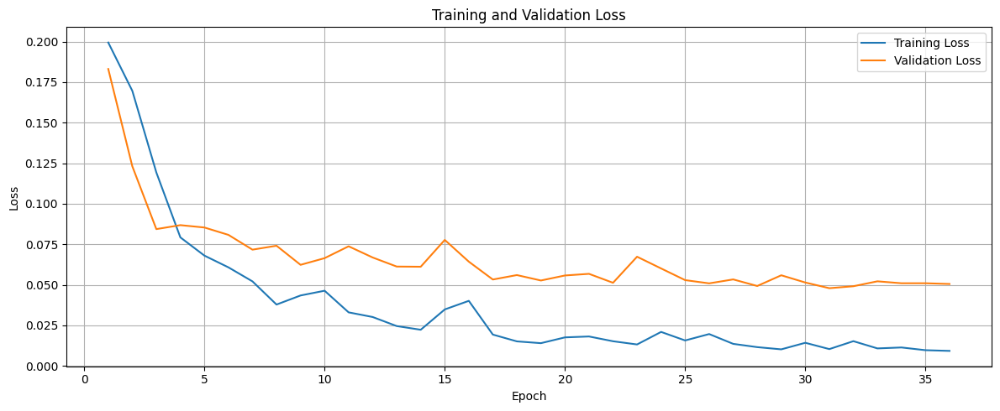

25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step 
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0408
LSTMSeq2SeqReduction.execute(): mae = 0.040790215134620667
LSTMSeq2SeqReduction._define_encoder_model(): is called
LSTMSeq2SeqReduction._encode_data(): is called
122/122 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step


Model: "aod_LSTMSeq2SeqReduction_15_features"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_9       │ (None, 7, 18)     │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_18 (LSTM)      │ (None, 7, 100)    │     47,600 │ input_layer_9[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_19 (LSTM)      │ [(None, 50),      │     30,200 │ lstm_18[0][0]     │
│                     │ (None, 50),       │            │                   │
│                     │ (None, 50)]       │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_9 (Dense)     │ (None, 15)        │        765 │ lstm_19[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_7     │ (None, 7, 15)     │          0 │ dense_9[0][0]     │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_20 (LSTM)      │ (None, 7, 50)     │     13,200 │ repeat_vector_7[… │
│                     │                   │            │ lstm_19[0][1],    │
│                     │                   │            │ lstm_19[0][2]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_21 (LSTM)      │ (None, 7, 100)    │     60,400 │ lstm_20[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ time_distributed_7  │ (None, 7, 18)     │      1,818 │ lstm_21[0][0]     │
│ (TimeDistributed)   │                   │            │                   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 461,951 (1.76 MB)

 Trainable params: 153,983 (601.50 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 307,968 (1.17 MB)

None


Model: "aod_LSTMSeq2SeqReduction_15_features_encoder"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_10 (InputLayer)     │ (None, 7, 18)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_18 (LSTM)                  │ (None, 7, 100)         │        47,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_19 (LSTM)                  │ [(None, 50), (None,    │        30,200 │
│                                 │ 50), (None, 50)]       │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 15)             │           765 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 78,565 (306.89 KB)

 Trainable params: 78,565 (306.89 KB)

 Non-trainable params: 0 (0.00 B)

None
LSTMPrediction._prepare_data(): is called


Model: "aod_LSTMPrediction_3_future_with_LSTMSeq2SeqReduction_15_features"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_11      │ (None, 7, 16)     │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_22 (LSTM)      │ [(None, 64),      │     20,736 │ input_layer_11[0… │
│                     │ (None, 64),       │            │                   │
│                     │ (None, 64)]       │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_8     │ (None, 3, 64)     │          0 │ lstm_22[0][0]     │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_23 (LSTM)      │ (None, 3, 64)     │     33,024 │ repeat_vector_8[… │
│                     │                   │            │ lstm_22[0][1],    │
│                     │                   │            │ lstm_22[0][2]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_5 (Dropout) │ (None, 3, 64)     │          0 │ lstm_23[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ time_distributed_8  │ (None, 3, 1)      │         65 │ dropout_5[0][0]   │
│ (TimeDistributed)   │                   │            │                   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 53,825 (210.25 KB)

 Trainable params: 53,825 (210.25 KB)

 Non-trainable params: 0 (0.00 B)

None
LSTMPrediction.execute(): is called
LSTMPrediction._train_model(): is called


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 1/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 9s 243ms/step - loss: 0.0290 - val_loss: 0.0187
Epoch 2/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0204 - val_loss: 0.0166
Epoch 3/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0191 - val_loss: 0.0183
Epoch 4/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0206 - val_loss: 0.0162
Epoch 5/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0176 - val_loss: 0.0153
Epoch 6/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0170 - val_loss: 0.0140
Epoch 7/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0154 - val_loss: 0.0133
Epoch 8/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0153 - val_loss: 0.0133
Epoch 9/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0146 - val_loss: 0.0137
Epoch 10/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0162 - val_loss: 0.0140
Epoch 11/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0161 - val_loss: 0.0138
Epoch 12/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0

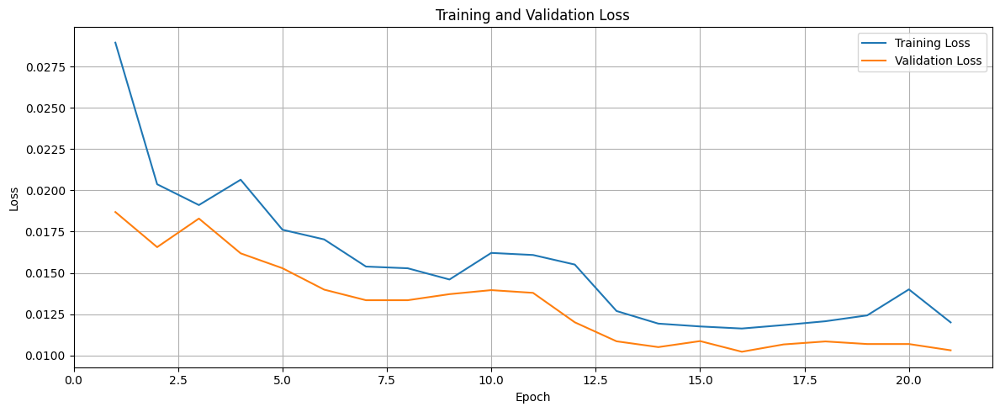

25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step 
y_pred.shape = (776, 3, 1)
y_test.shape = (776, 3, 1)
Day 1 - mae = 4.937834464206617, mse = 38.985418641274265, r2 = -6.865415856584274, rmse = 6.243830446230444, mape = 0.26810900678629357, mnbe = 2.72543005765975, r_coeff = [0.47081376], p_value = [4.61281546e-44]
Day 2 - mae = 5.1020870831546405, mse = 41.38795684654719, r2 = -7.5898779451241545, rmse = 6.433347250580151, mape = 0.2764150992554391, mnbe = 3.053478667591334, r_coeff = [0.40113619], p_value = [2.31806445e-31]
Day 3 - mae = 5.150460174365529, mse = 42.81019530130254, r2 = -8.379964573309175, rmse = 6.54295004575937, mape = 0.28114774346947796, mnbe = 2.426755852483074, r_coeff = [0.35640268], p_value = [1.17444567e-24]
avg_mae = 5.0634605739089285
avg_mse = 41.06119026304133
avg_r2 = -7.611752791672534
avg_rmse = 6.406709247523321
avg_mape = 0.27522394983707027
avg_mnbe = 2.735221525911386
avg_r_coeff = 0.4094508754902489
avg_p_value = 3.914819663247522e-25
Choosing the best re

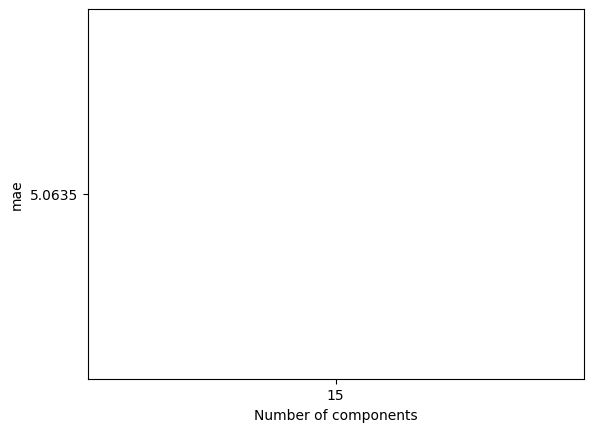

inv_y_pred.shape = (776, 1)
inv_y_test.shape = (776, 1)


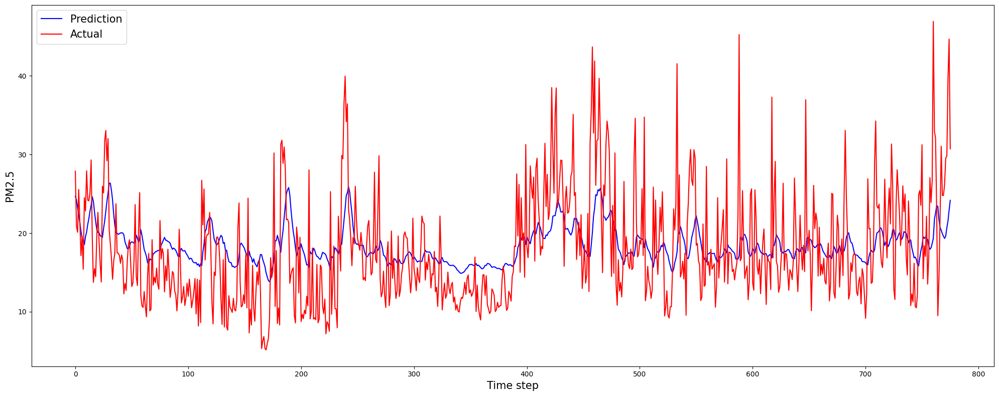

inv_y_pred.shape = (776, 1)
inv_y_test.shape = (776, 1)


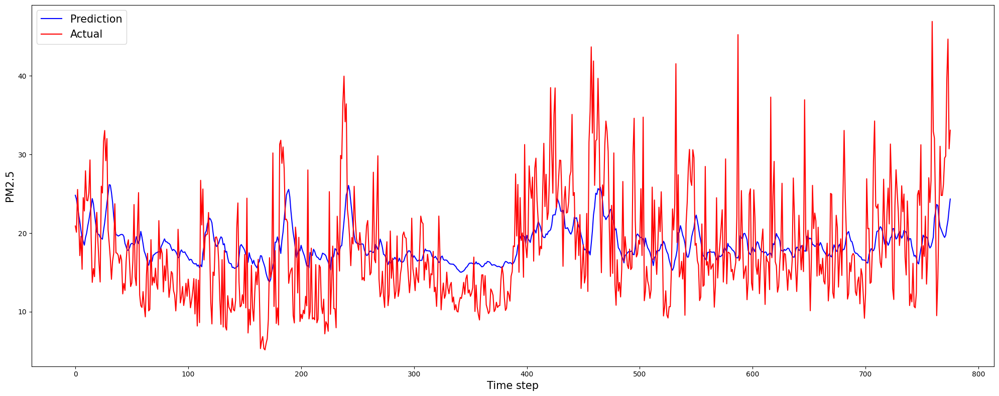

inv_y_pred.shape = (776, 1)
inv_y_test.shape = (776, 1)


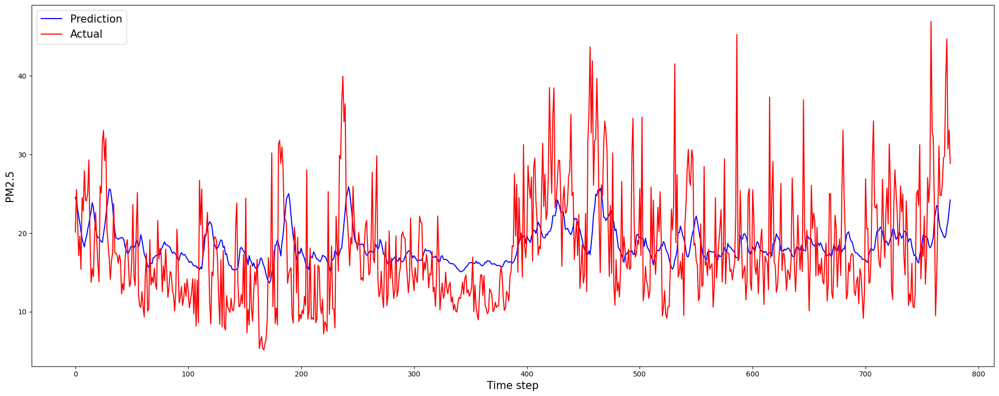

,dim_reduction_method,dim_after_reduction,prediction,n_future,mae,mse,rmse,r2,mape,mnbe,r_coeff,p_value
0,None,N/A,LSTM,1,5.150762,43.973842,6.631278,-1.869844,0.268606,5.777209,0.386350,4.982371e-29
1,None,N/A,LSTM,2,5.674127,45.203597,6.723034,-3.989177,0.275316,16.069522,0.496317,1.222096e-42
2,None,N/A,LSTM,3,5.782640,47.241641,6.862340,-4.271047,0.282422,15.411027,0.465428,7.994928e-36
3,LSTM-Seq2Seq,15,LSTM,1,4.865622,35.085687,5.923317,-2.138913,0.251993,9.266049,0.590187,5.206389e-74
4,LSTM-Seq2Seq,15,LSTM,2,4.807650,36.354167,6.025276,-2.508226,0.255541,5.747213,0.529328,3.294798e-46
5,LSTM-Seq2Seq,15,LSTM,3,5.063461,41.061190,6.406709,-7.611753,0.275224,2.735222,0.409451,3.914820e-25


In [36]:
# Loop every n_future
lstms2s_n_future_mapper = {}

for prediction_n_future in range_of_n_future:
    print("\n" + "=" * 100 + "\n")
    print(f"PREDICTION WITH N_FUTURE = {prediction_n_future}\n")
    loopresults = generate_loopresults(X_aod_scaled, y_aod_scaled,
                                       aod_label_scaler,
                                       range_of_dimension,
                                       LSTMSeq2SeqReduction,
                                       LSTMPrediction,
                                       "aod", "aod",
                                       reduction_n_past, reduction_n_future,
                                       reduction_epochs, reduction_batch_size,
                                       prediction_n_past, prediction_n_future,
                                       prediction_epochs, prediction_batch_size,
                                       saved_model_weight_dir, saved_model_plot_dir)
    best_metrics, best_num_of_components, best_encoded_data, best_evaluation_data, best_encoder_model_path, best_prediction_model_path = choose_the_best(loopresults, "mae", prediction_n_future)
    
    # Update the evaluation board
    evaluation_board['dim_reduction_method'] += ["LSTM-Seq2Seq"]
    evaluation_board['dim_after_reduction'] += [best_num_of_components]
    evaluation_board['n_future'] += [prediction_n_future]
    evaluation_board['prediction'] += ["LSTM"]
    for metric, value in best_metrics.items():
        evaluation_board[metric] += [value]
    display(pd.DataFrame(evaluation_board))

    # Update n_future mapper
    lstms2s_n_future_mapper[prediction_n_future] = (best_encoded_data, best_evaluation_data, best_encoder_model_path, best_prediction_model_path)

#### Prepare reduced data

In [37]:
# Create the mapper for inference data
lstms2s_n_future_inference_mapper = {}

# Loop over n_future mapper
for prediction_n_future, (best_encoded_data, _, best_encoder_model_path, best_prediction_model_path) in lstms2s_n_future_mapper.items():
    print("\n" + "=" * 100 + "\n")
    print(f"PREDICTION WITH N_FUTURE = {prediction_n_future}\n")
    
    # Copy the best reduction model to target directory
    shutil.copy(best_encoder_model_path, conf["workspace"]["best_model_weight_dir"])
    shutil.copy(best_prediction_model_path, conf["workspace"]["best_model_weight_dir"])
    
    # Inference LSTM
    pred_pm25_from_df_lstms2s_reduced = inferenceLSTM(best_encoded_data, y_aod_scaled,
                                                        prediction_n_past, prediction_n_future,
                                                        best_prediction_model_path, verbose=1)
    inv_pred_pm25_from_df_lstms2s_reduced = aod_label_scaler.inverse_transform(np.squeeze(pred_pm25_from_df_lstms2s_reduced, axis=-1))
    print(inv_pred_pm25_from_df_lstms2s_reduced.shape)
    
    # Prepare the reduced data
    df_lstms2s_reduced = prepareReducedData(best_encoded_data, aod_time_indices,
                                            (aod_station_column, "station"),
                                            *[(inv_pred_pm25_from_df_lstms2s_reduced[:, day], f"predicted_pm25_day_{day+1}") for day in range(inv_pred_pm25_from_df_lstms2s_reduced.shape[-1])],
                                            (aod_pm25_3km_column, "pm25_3km"))
    df_lstms2s_reduced.to_csv(os.path.join(conf["workspace"]["best_reduced_data_dir"], f"df_lstms2s_reduced_2018_2022_{prediction_n_future}_day.csv"))
    df_lstms2s_reduced.to_csv(os.path.join(conf["workspace"]["data_to_store_in_hdfs_dir"], f"vientham_2018_2022_reduced_with_lstms2s_{prediction_n_future}_day.csv"))
    display(df_lstms2s_reduced)

    # Update the n_future inference mapper
    lstms2s_n_future_inference_mapper[prediction_n_future] = df_lstms2s_reduced



PREDICTION WITH N_FUTURE = 1

122/122 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step
(3889, 1)


,aod_feature_1,aod_feature_2,aod_feature_3,aod_feature_4,aod_feature_5,aod_feature_6,aod_feature_7,aod_feature_8,aod_feature_9,aod_feature_10,aod_feature_11,aod_feature_12,aod_feature_13,aod_feature_14,aod_feature_15,station,predicted_pm25_day_1,pm25_3km
time,,,,,,,,,,,,,,,,,,
2018-01-01,-0.082176,-0.333512,-0.045075,0.742012,0.168413,-1.378280,-0.389758,0.050144,-0.804076,-0.113651,-0.463646,0.902957,-0.052997,0.338759,0.375808,201,28.539894,34.919998
2018-01-02,-0.082176,-0.333512,-0.045075,0.742012,0.168413,-1.378280,-0.389758,0.050144,-0.804076,-0.113651,-0.463646,0.902957,-0.052997,0.338759,0.375808,201,28.539894,51.830002
2018-01-03,-0.081501,-0.333445,-0.045744,0.739449,0.166402,-1.376121,-0.390701,0.051179,-0.802741,-0.114322,-0.463776,0.902585,-0.051665,0.338475,0.376697,201,30.074024,38.240002
2018-01-04,-0.080127,-0.335088,-0.047328,0.739106,0.164744,-1.376584,-0.392147,0.051734,-0.800121,-0.114229,-0.464975,0.903940,-0.048783,0.340924,0.378145,201,37.792595,40.259998
2018-01-05,-0.078106,-0.337714,-0.046641,0.741483,0.162142,-1.381585,-0.395686,0.054231,-0.799615,-0.115713,-0.466821,0.910558,-0.045765,0.346585,0.380350,201,39.897053,21.690001
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-27,0.114583,-0.483874,-0.198318,0.377256,-0.151242,-0.420129,-0.105321,0.649027,-0.417463,-0.305140,-0.420448,0.445429,0.474994,0.040782,0.358458,216,25.885471,34.439411
2022-12-28,0.113826,-0.481204,-0.197982,0.373709,-0.151395,-0.415310,-0.104162,0.648561,-0.413424,-0.303026,-0.417566,0.439702,0.474620,0.040239,0.358034,216,28.265532,29.838476
2022-12-29,0.111044,-0.476423,-0.195819,0.368613,-0.149241,-0.406515,-0.096147,0.644436,-0.405648,-0.296218,-0.410479,0.428208,0.470764,0.037378,0.354812,216,30.706022,28.450829




PREDICTION WITH N_FUTURE = 2

122/122 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step
(3889, 2)


,aod_feature_1,aod_feature_2,aod_feature_3,aod_feature_4,aod_feature_5,aod_feature_6,aod_feature_7,aod_feature_8,aod_feature_9,aod_feature_10,aod_feature_11,aod_feature_12,aod_feature_13,aod_feature_14,aod_feature_15,station,predicted_pm25_day_1,predicted_pm25_day_2,pm25_3km
time,,,,,,,,,,,,,,,,,,,
2018-01-01,-0.574764,-0.076916,-1.401411,-1.457147,0.347359,0.770919,-0.252675,0.077612,-1.614626,0.116107,-0.796901,1.911109,0.488720,-0.889839,-2.045780,201,26.809511,26.893103,34.919998
2018-01-02,-0.574764,-0.076916,-1.401411,-1.457147,0.347359,0.770919,-0.252675,0.077612,-1.614626,0.116107,-0.796901,1.911109,0.488720,-0.889839,-2.045780,201,26.809511,26.893103,51.830002
2018-01-03,-0.571684,-0.078976,-1.400743,-1.455065,0.349487,0.774853,-0.249354,0.077417,-1.614369,0.117061,-0.794650,1.912816,0.489973,-0.888087,-2.045222,201,28.609293,28.718000,38.240002
2018-01-04,-0.568394,-0.082837,-1.400936,-1.456737,0.353367,0.780690,-0.248260,0.074824,-1.622788,0.115375,-0.795882,1.919015,0.492677,-0.891658,-2.049690,201,36.677284,36.822067,40.259998
2018-01-05,-0.571074,-0.086781,-1.409232,-1.470553,0.356046,0.786638,-0.258087,0.067516,-1.647825,0.108335,-0.810414,1.930881,0.498180,-0.906329,-2.062445,201,38.319218,38.442154,21.690001
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-27,0.017237,0.084588,-0.714884,-0.738909,0.001849,0.451258,0.170242,0.034427,-0.480497,0.060056,-0.151827,0.839485,0.103053,0.039964,-0.698112,216,24.943386,25.643072,34.439411
2022-12-28,0.019026,0.084536,-0.708790,-0.733257,0.001975,0.448670,0.172100,0.034554,-0.475777,0.061688,-0.147434,0.834068,0.104293,0.044675,-0.694569,216,27.373266,28.148153,29.838476
2022-12-29,0.019481,0.086822,-0.695208,-0.718597,0.002344,0.439359,0.172782,0.035240,-0.460787,0.067815,-0.137252,0.819928,0.103828,0.051081,-0.683492,216,29.833948,30.662661,28.450829




PREDICTION WITH N_FUTURE = 3

122/122 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step
(3889, 3)


,aod_feature_1,aod_feature_2,aod_feature_3,aod_feature_4,aod_feature_5,aod_feature_6,aod_feature_7,aod_feature_8,aod_feature_9,aod_feature_10,aod_feature_11,aod_feature_12,aod_feature_13,aod_feature_14,aod_feature_15,station,predicted_pm25_day_1,predicted_pm25_day_2,predicted_pm25_day_3,pm25_3km
time,,,,,,,,,,,,,,,,,,,,
2018-01-01,-0.767436,-0.239463,0.495154,1.061153,1.349640,0.378551,0.539141,0.734478,1.213469,-0.057176,0.454421,-0.472760,-1.934092,0.839158,-0.747227,201,31.022760,30.816753,30.106098,34.919998
2018-01-02,-0.767436,-0.239463,0.495154,1.061153,1.349640,0.378551,0.539141,0.734478,1.213469,-0.057176,0.454421,-0.472760,-1.934092,0.839158,-0.747227,201,31.022760,30.816753,30.106098,51.830002
2018-01-03,-0.769707,-0.240587,0.495704,1.063935,1.354008,0.379081,0.539308,0.736389,1.214727,-0.056521,0.456721,-0.473525,-1.937120,0.840998,-0.749621,201,31.741568,31.557255,30.842882,38.240002
2018-01-04,-0.777080,-0.243423,0.499045,1.073505,1.367564,0.380935,0.541631,0.742893,1.220617,-0.054611,0.462568,-0.477610,-1.950922,0.848068,-0.757403,201,35.724476,35.767414,35.089413,40.259998
2018-01-05,-0.786023,-0.244785,0.500755,1.081794,1.381564,0.382321,0.549604,0.753865,1.224259,-0.052274,0.468892,-0.479243,-1.969611,0.857116,-0.769274,201,37.997559,38.085857,37.368652,21.690001
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-27,-0.256357,0.059733,0.674940,0.587943,1.406109,0.426212,0.504245,0.117615,1.108185,-0.161354,0.251046,0.053891,-0.901659,0.276385,-0.216760,216,21.535450,21.626686,21.512569,34.439411
2022-12-28,-0.247749,0.064739,0.668655,0.578117,1.397718,0.423218,0.499882,0.110985,1.093904,-0.163944,0.247230,0.057890,-0.884744,0.273616,-0.207639,216,22.926594,23.046974,22.921694,29.838476
2022-12-29,-0.240440,0.068034,0.656284,0.570694,1.376468,0.420815,0.493162,0.104507,1.074720,-0.161494,0.243112,0.055813,-0.870231,0.271888,-0.202366,216,24.171997,24.339527,24.217690,28.450829


#### Compare MAE with pm25_3km



PREDICTION WITH N_FUTURE = 1

(1, 776, 1)
(1, 776, 1)


Day 1:

current_day_inv_y_pred.shape =  (776, 1)
test_len =  776
On test data:
MAE between actual and pm25_3km: 6.785086281801943
MAE between actual and predicted pm25: 4.865621911838545
MSE between actual and pm25_3km: 87.2793385941348
MSE between actual and predicted pm25: 35.08568684781936


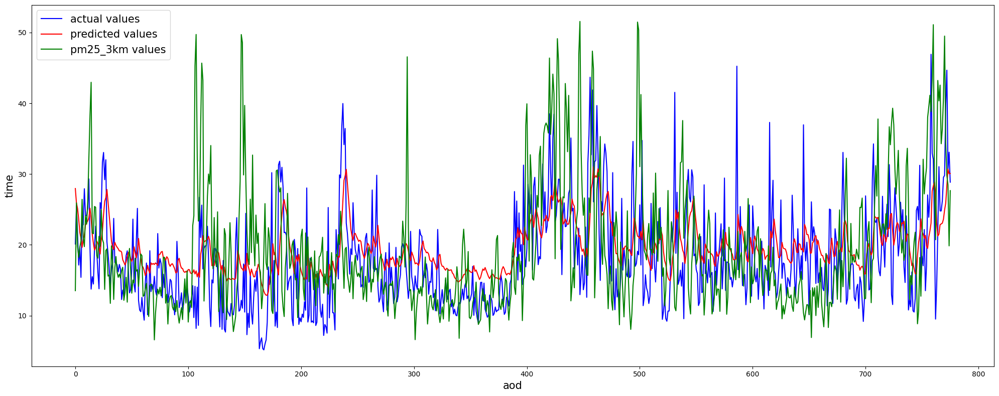

On entire data:
MAE between actual and pm25_3km: 7.875957292759844
MAE between actual and predicted pm25: 5.610621929168701


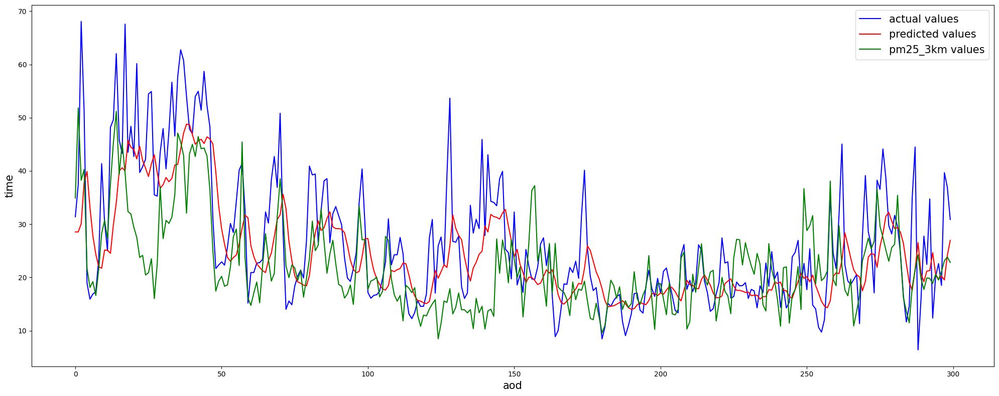

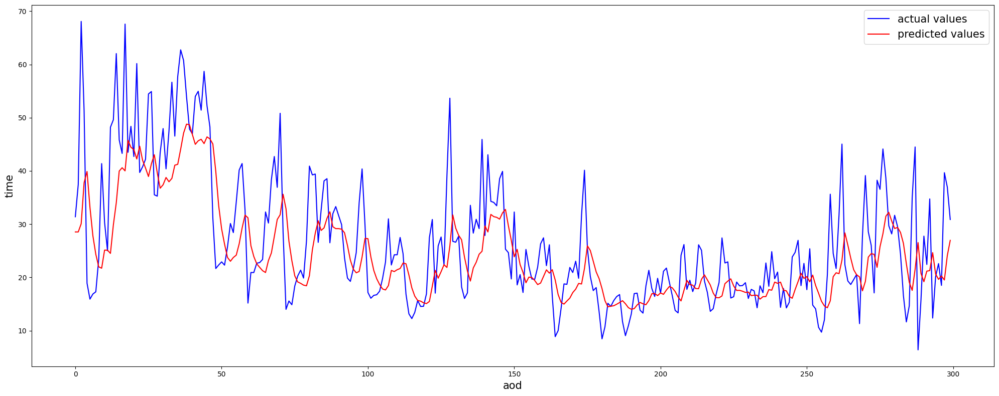

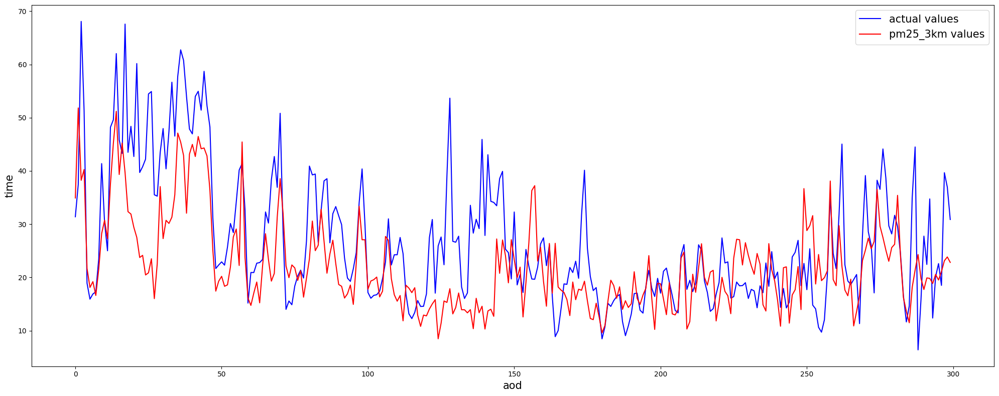



PREDICTION WITH N_FUTURE = 2

(2, 776, 1)
(2, 776, 1)


Day 1:

current_day_inv_y_pred.shape =  (776, 1)
test_len =  776
On test data:
MAE between actual and pm25_3km: 6.886267722971287
MAE between actual and predicted pm25: 4.587520094779132
MSE between actual and pm25_3km: 87.62000601461646
MSE between actual and predicted pm25: 33.653762350783964


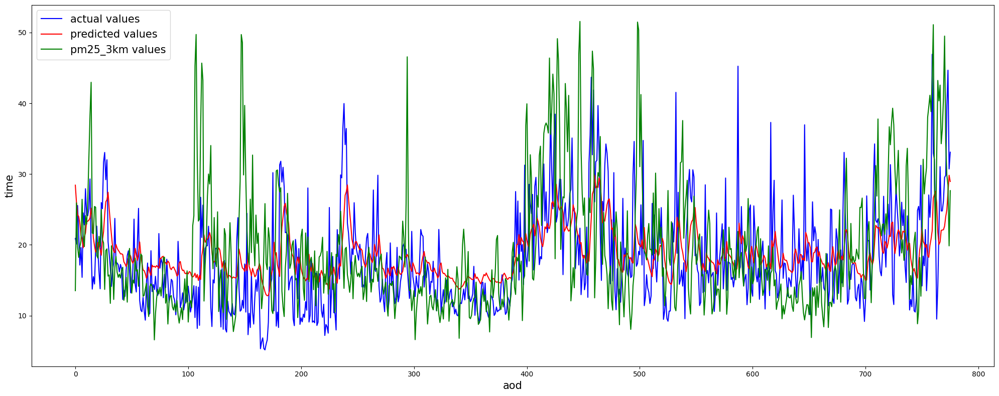

On entire data:
MAE between actual and pm25_3km: 7.875957292759844
MAE between actual and predicted pm25: 5.8510422706604


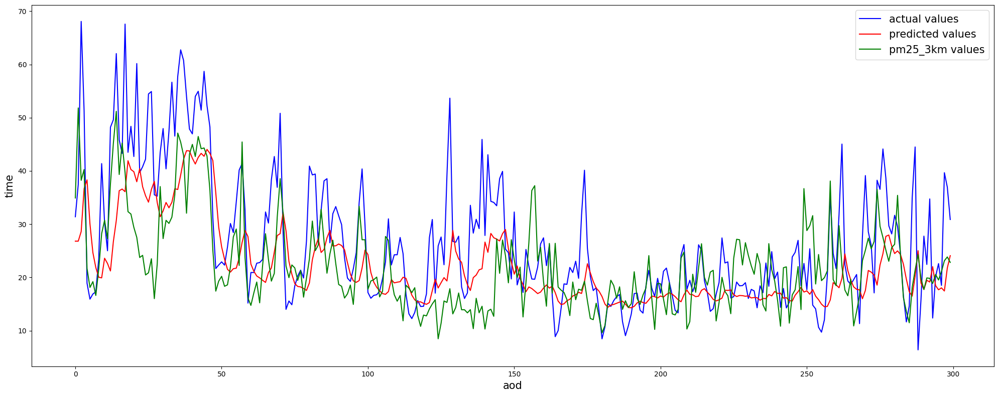

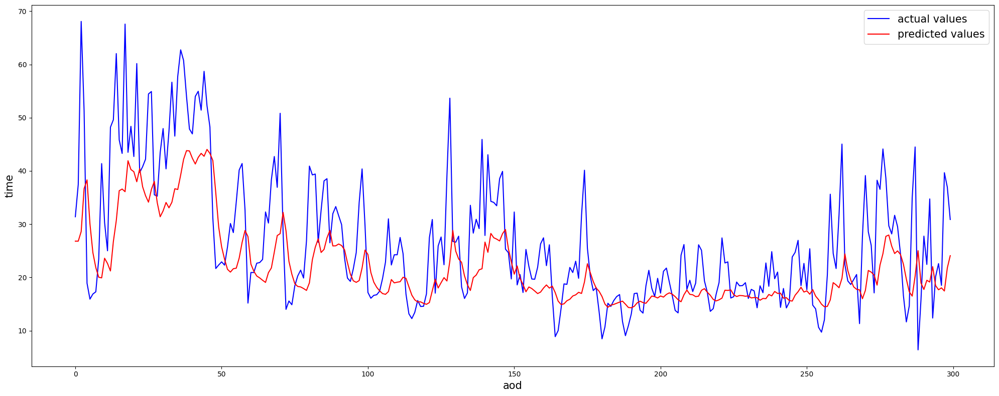

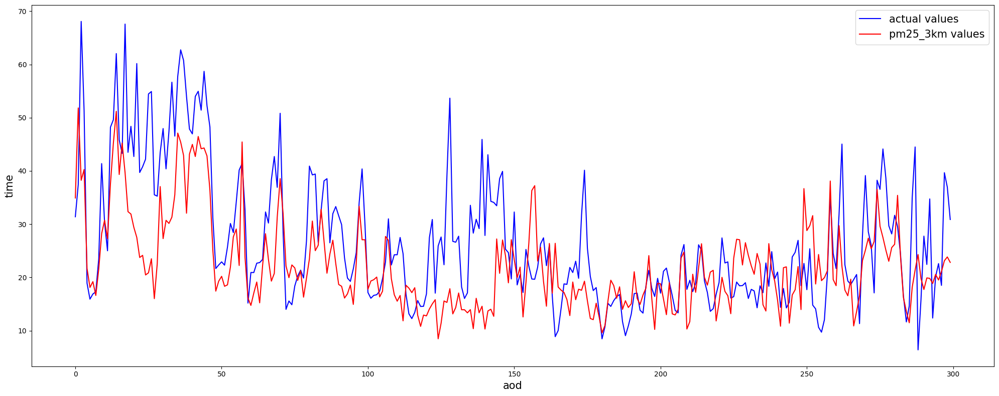



Day 2:

current_day_inv_y_pred.shape =  (776, 1)
test_len =  776
On test data:
MAE between actual and pm25_3km: 6.785086281801943
MAE between actual and predicted pm25: 5.027780336620869
MSE between actual and pm25_3km: 87.2793385941348
MSE between actual and predicted pm25: 39.0545719009477


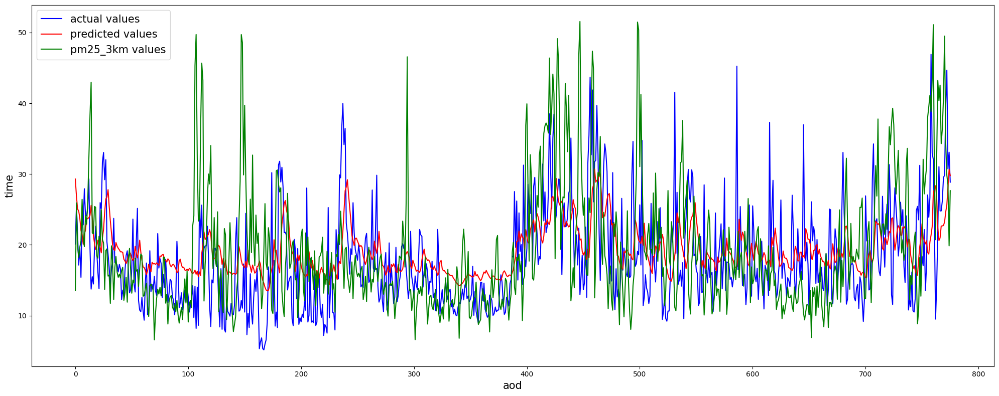

On entire data:
MAE between actual and pm25_3km: 7.875957292759844
MAE between actual and predicted pm25: 5.857971668243408


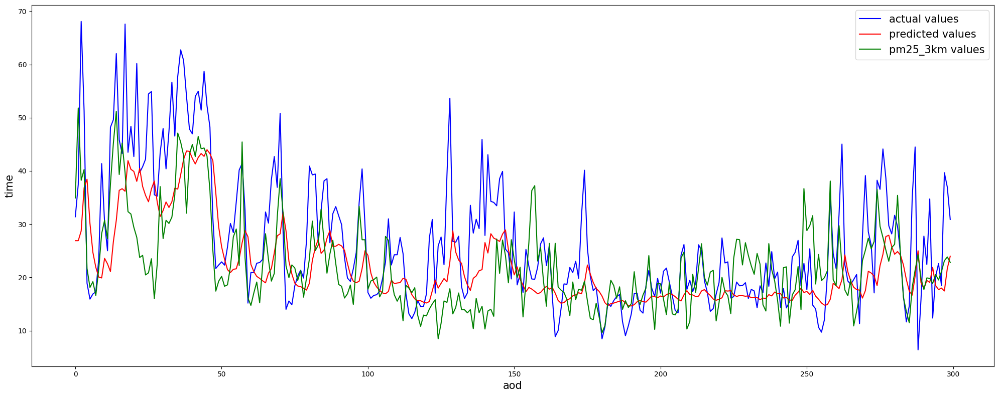

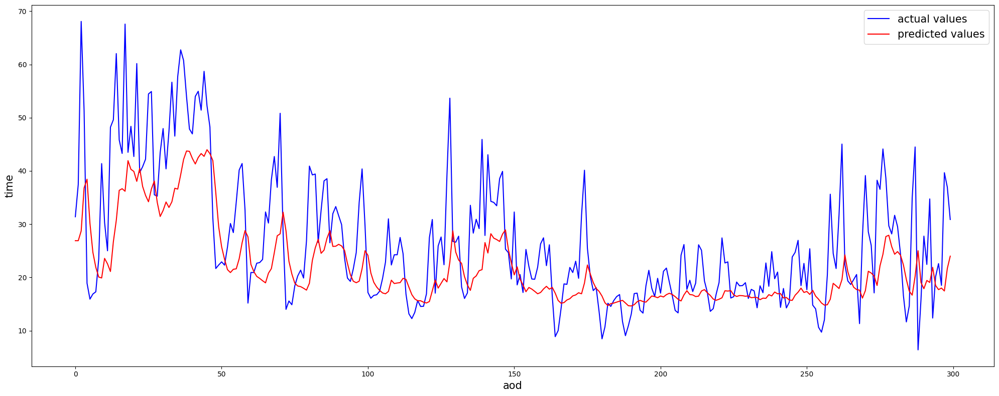

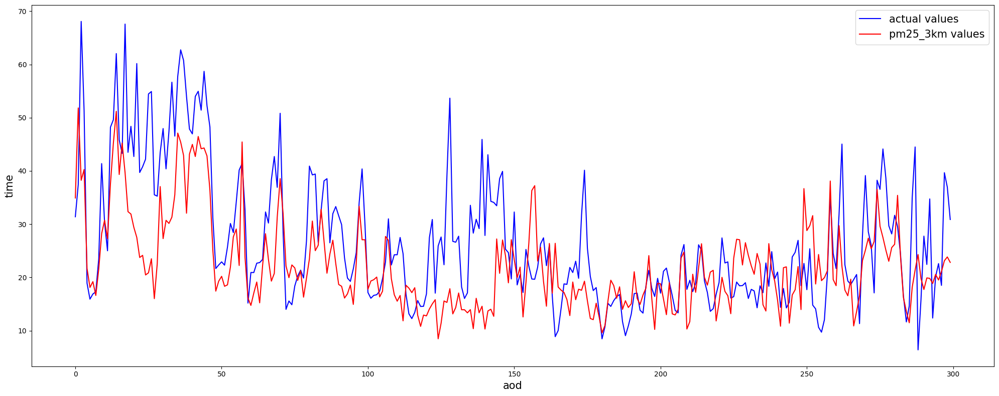



PREDICTION WITH N_FUTURE = 3

(3, 776, 1)
(3, 776, 1)


Day 1:

current_day_inv_y_pred.shape =  (776, 1)
test_len =  776
On test data:
MAE between actual and pm25_3km: 6.822880072083751
MAE between actual and predicted pm25: 4.937834464206617
MSE between actual and pm25_3km: 88.04226960444231
MSE between actual and predicted pm25: 38.985418641274265


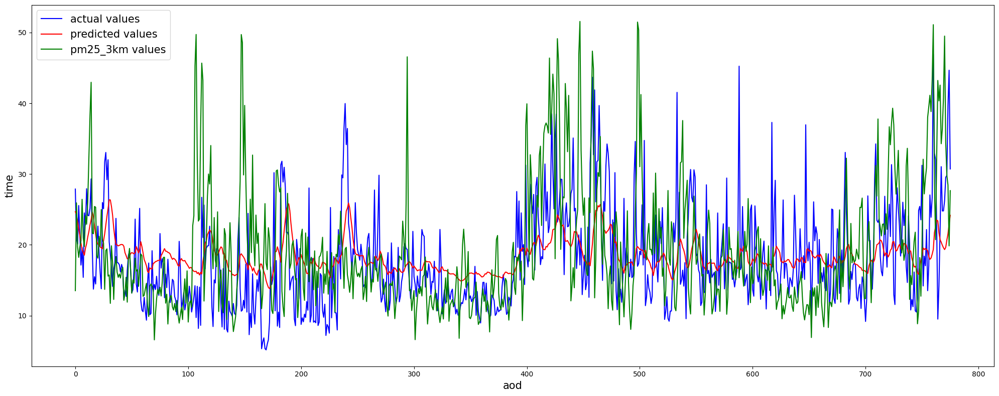

On entire data:
MAE between actual and pm25_3km: 7.875957292759844
MAE between actual and predicted pm25: 6.284725666046143


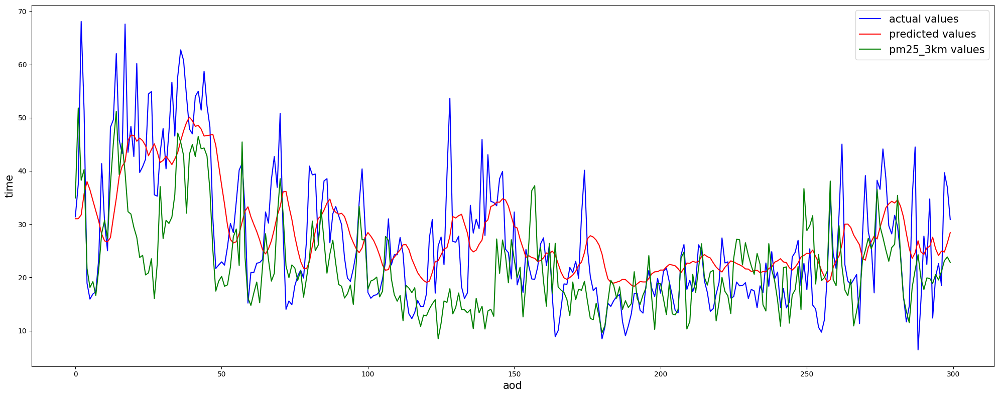

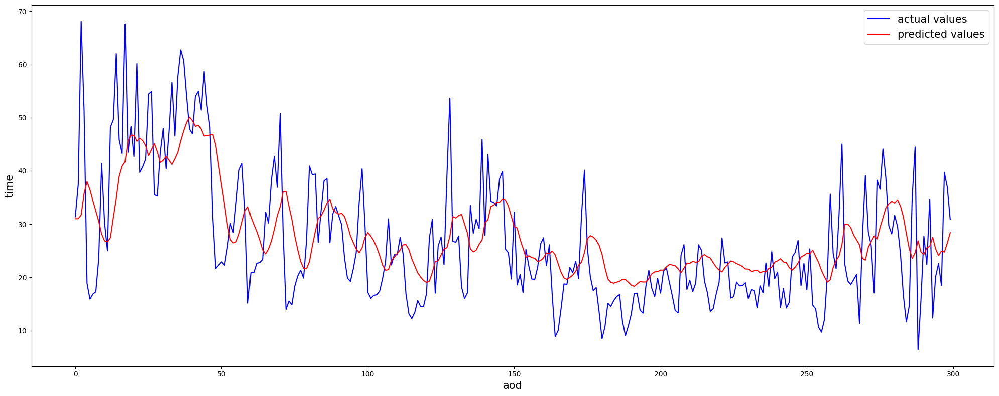

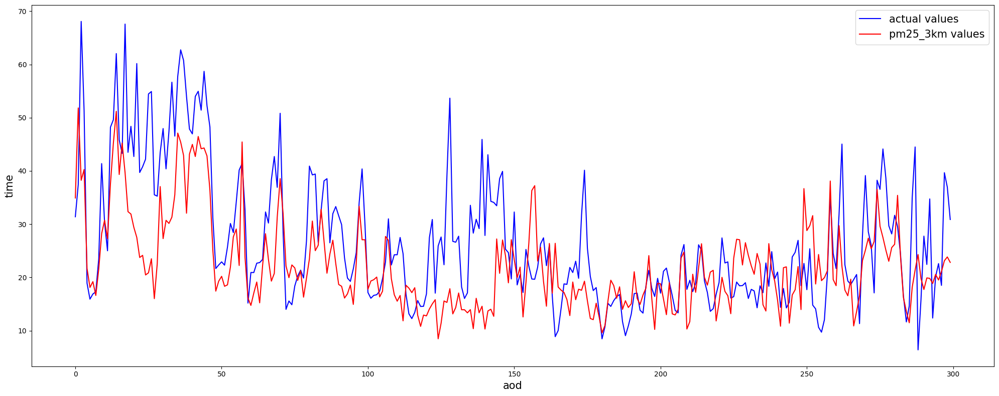



Day 2:

current_day_inv_y_pred.shape =  (776, 1)
test_len =  776
On test data:
MAE between actual and pm25_3km: 6.886267722971287
MAE between actual and predicted pm25: 5.1020870831546405
MSE between actual and pm25_3km: 87.62000601461646
MSE between actual and predicted pm25: 41.38795684654719


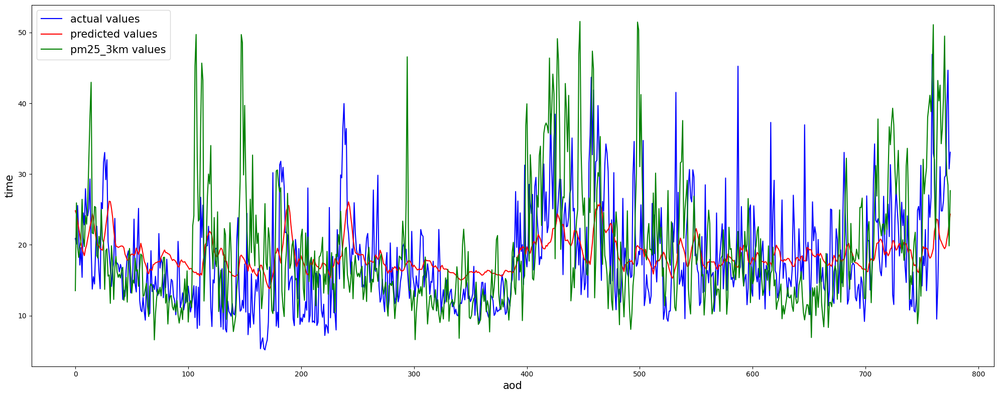

On entire data:
MAE between actual and pm25_3km: 7.875957292759844
MAE between actual and predicted pm25: 6.281198978424072


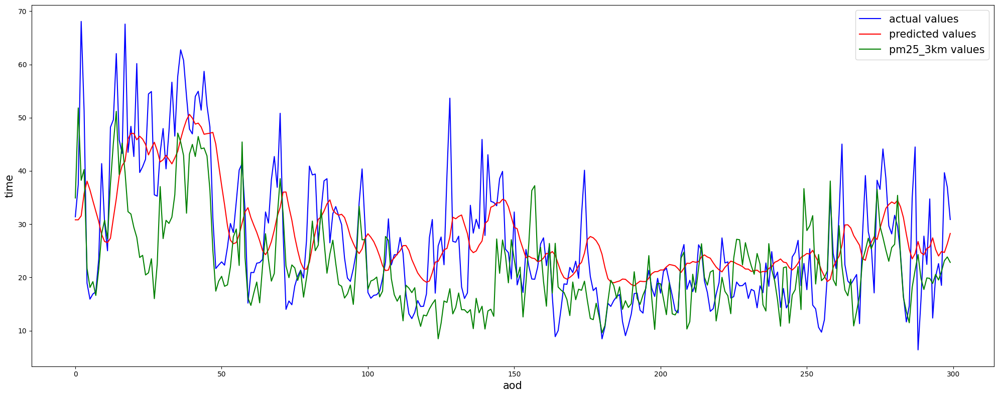

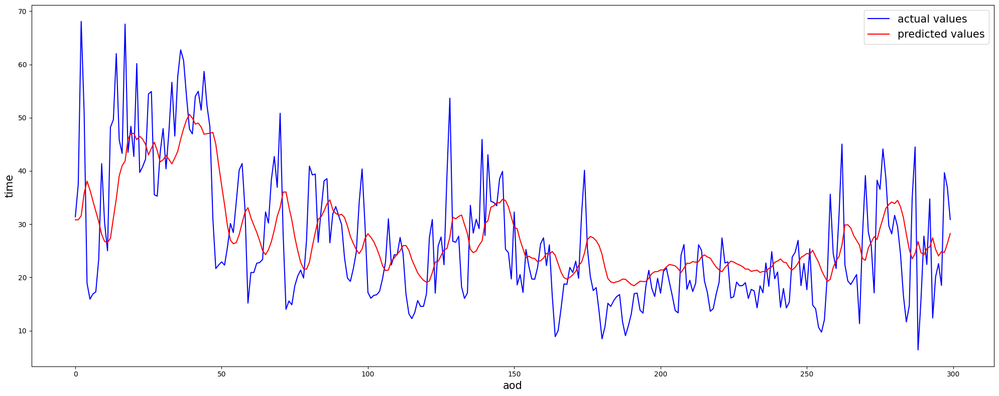

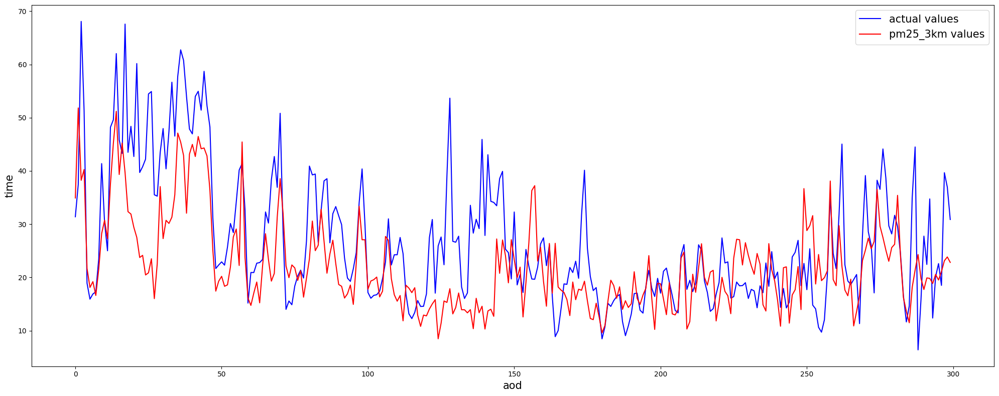



Day 3:

current_day_inv_y_pred.shape =  (776, 1)
test_len =  776
On test data:
MAE between actual and pm25_3km: 6.785086281801943
MAE between actual and predicted pm25: 5.150460174365529
MSE between actual and pm25_3km: 87.2793385941348
MSE between actual and predicted pm25: 42.81019530130254


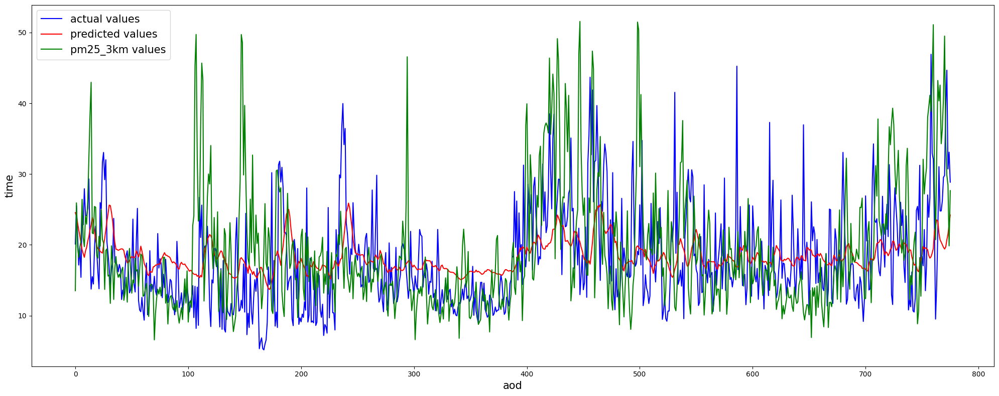

On entire data:
MAE between actual and pm25_3km: 7.875957292759844
MAE between actual and predicted pm25: 6.237199306488037


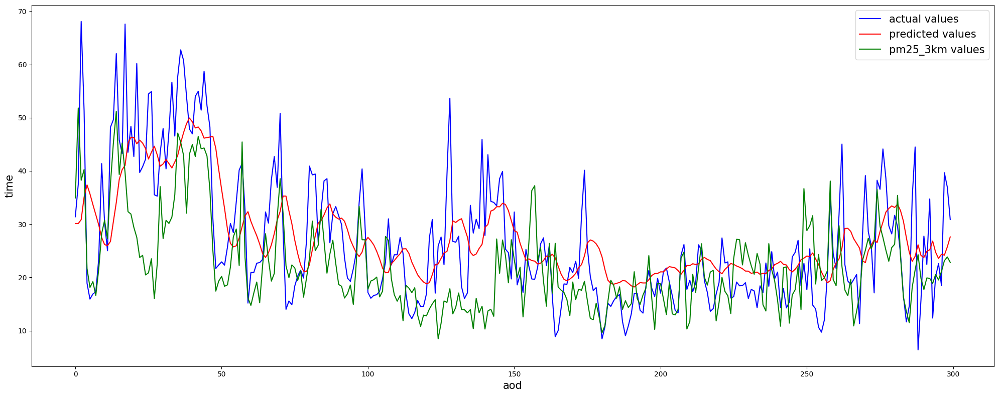

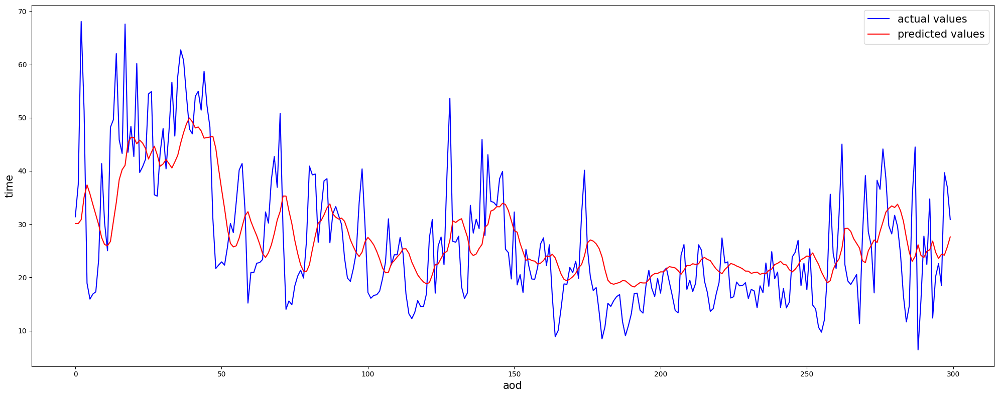

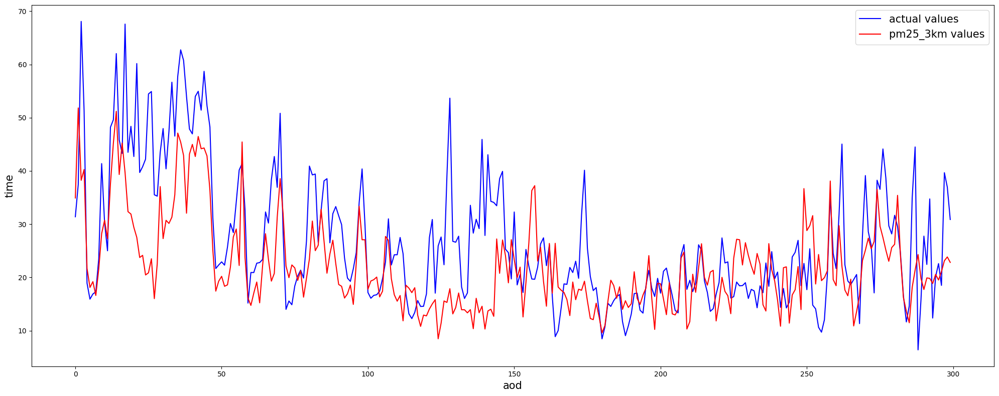

In [40]:
for prediction_n_future, (best_encoded_data, best_evaluation_data, best_encoder_model_path, best_prediction_model_path) in lstms2s_n_future_mapper.items():
    
    print("\n" + "=" * 100 + "\n")
    print(f"PREDICTION WITH N_FUTURE = {prediction_n_future}\n")
    
    # Compare test set only
    all_days_inv_y_pred, all_days_inv_y_test = best_evaluation_data
    df_lstms2s_reduced = lstms2s_n_future_inference_mapper[prediction_n_future]

    print(all_days_inv_y_pred.shape)
    print(all_days_inv_y_test.shape)
    
    for day in range(prediction_n_future):
        
        print("\n" + "=" * 50 + "\n")
        print(f"Day {day+1}:\n")
        
        current_day_inv_y_pred = all_days_inv_y_pred[day]
        current_day_inv_y_test = all_days_inv_y_test[day]
        print("current_day_inv_y_pred.shape = ", current_day_inv_y_pred.shape)
        
        test_len = current_day_inv_y_test.shape[0]
        print("test_len = ", test_len)
        
        aod_pm25_3km_column_test = aod_pm25_3km_column.tail(test_len)
        
        print("On test data:")
        print(f"MAE between actual and pm25_3km: {mean_absolute_error(current_day_inv_y_test, aod_pm25_3km_column_test)}")
        print(f"MAE between actual and predicted pm25: {mean_absolute_error(current_day_inv_y_test, current_day_inv_y_pred)}")
        print(f"MSE between actual and pm25_3km: {mean_squared_error(current_day_inv_y_test, aod_pm25_3km_column_test)}")
        print(f"MSE between actual and predicted pm25: {mean_squared_error(current_day_inv_y_test, current_day_inv_y_pred)}")
        plot_3_data(data1=current_day_inv_y_test,
                   datalabel1="actual values",
                   data2=current_day_inv_y_pred,
                   datalabel2="predicted values",
                   data3=aod_pm25_3km_column_test,
                   datalabel3="pm25_3km values",
                   ylabel="time",
                   xlabel="aod")
        
        # Compare entire dataset
        print("On entire data:")
        current_day_inv_pred_pm25_from_df_lstms2s_reduced = df_lstms2s_reduced.loc[:, f"predicted_pm25_day_{day+1}"]
        print(f"MAE between actual and pm25_3km: {mean_absolute_error(y_aod, aod_pm25_3km_column)}")
        print(f"MAE between actual and predicted pm25: {mean_absolute_error(y_aod, current_day_inv_pred_pm25_from_df_lstms2s_reduced)}")
        plot_3_data(data1=y_aod.head(300),
                   datalabel1="actual values",
                   data2=current_day_inv_pred_pm25_from_df_lstms2s_reduced[:300],
                   datalabel2="predicted values",
                   data3=aod_pm25_3km_column.head(300),
                   datalabel3="pm25_3km values",
                   ylabel="time",
                   xlabel="aod")
        plot_2_data(data1=y_aod.head(300),
                   datalabel1="actual values",
                   data2=current_day_inv_pred_pm25_from_df_lstms2s_reduced[:300],
                   datalabel2="predicted values",
                   ylabel="time",
                   xlabel="aod")
        plot_2_data(data1=y_aod.head(300),
                   datalabel1="actual values",
                   data2=aod_pm25_3km_column.head(300),
                   datalabel2="pm25_3km values",
                   ylabel="time",
                   xlabel="aod")

#### Compare MAE with CMAQ pm25

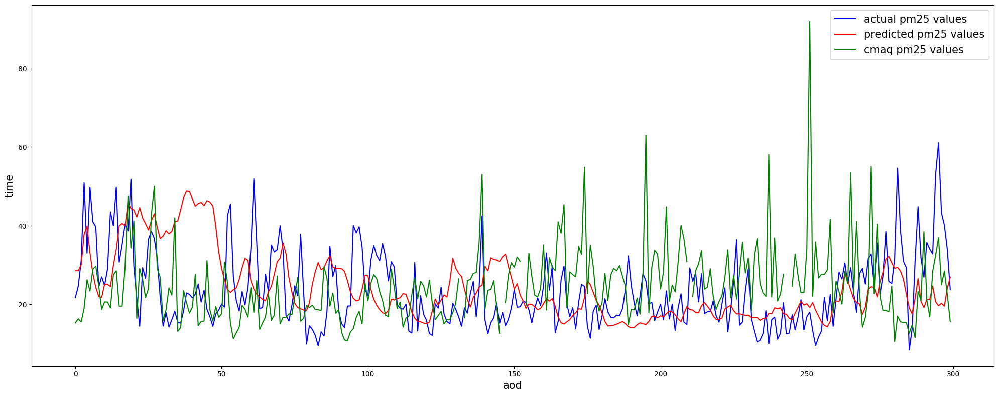

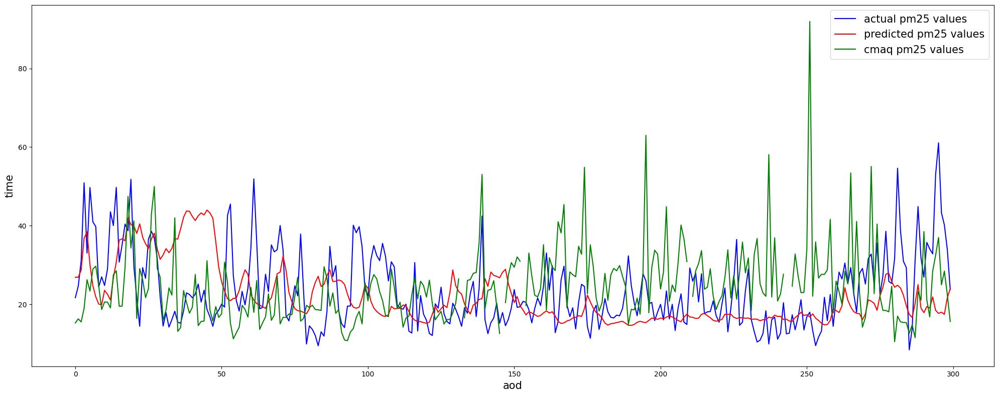

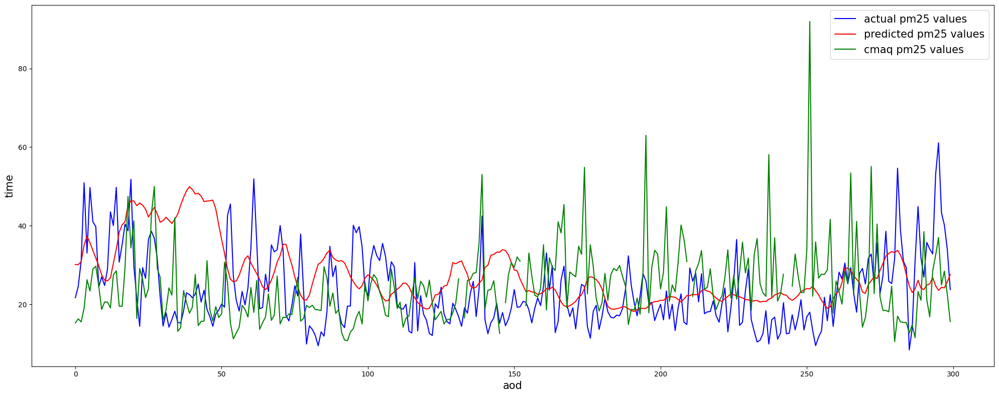

In [41]:
# Remove station 202 for original data
df_aod_dropped_202 = df_aod[df_aod["station"] != 202]
time_mask = ((df_aod_dropped_202.index >= "2022-01-01") & (df_aod_dropped_202.index <= "2022-12-31"))
df_aod_dropped_202 = df_aod_dropped_202.loc[time_mask]

# Loop over n_future
for prediction_n_future, df_lstms2s_reduced in lstms2s_n_future_inference_mapper.items():
    df_lstms2s_reduced_dropped_202 = df_lstms2s_reduced[df_lstms2s_reduced["station"] != 202]
    time_mask = ((df_lstms2s_reduced_dropped_202.index >= "2022-01-01") & (df_lstms2s_reduced_dropped_202.index <= "2022-12-31"))
    df_lstms2s_reduced_dropped_202 = df_lstms2s_reduced_dropped_202.loc[time_mask]
    
    for day in range(prediction_n_future):
        current_day_inv_pred_pm25_from_df_lstms2s_reduced = df_lstms2s_reduced.loc[:, f"predicted_pm25_day_{day+1}"]

    # Compare entire dataset
    plot_3_data(data1=df_aod_dropped_202["pm25"].head(300),
               datalabel1="actual pm25 values",
               data2=current_day_inv_pred_pm25_from_df_lstms2s_reduced.head(300),
               datalabel2="predicted pm25 values",
               data3=df_cmaq_daily["pm25"].head(300),
               datalabel3="cmaq pm25 values",
               ylabel="time",
               xlabel="aod")

In [42]:
stop

NameError: name 'stop' is not defined

### Prediction + GRU-Seq2Seq

#### Doing the loop

In [ ]:
loopresults = generate_loopresults(X_aod_scaled, y_aod_scaled,
                                   aod_label_scaler,
                                   range_of_dimension,
                                   GRUSeq2SeqReduction,
                                   LSTMPrediction,
                                   reduction_n_past, reduction_n_future,
                                   reduction_epochs, reduction_batch_size,
                                   prediction_n_past, prediction_n_future,
                                   prediction_epochs, prediction_batch_size)
best = choose_the_best(loopresults, metric_to_choose="mae")
best_metrics, best_num_of_components, best_encoded_data, best_evaluation_data, best_encoder_model_path, best_prediction_model_path = best

# Print out the evaluation board
evaluation_board['dim_reduction_method'] += ["GRU-Seq2Seq"]
evaluation_board['dim_after_reduction'] += [best_num_of_components]
evaluation_board['prediction'] += ["LSTM"]
for metric, value in best_metrics.items():
    evaluation_board[metric] += [value]
pd.DataFrame(evaluation_board)

#### Prepare reduced data

In [ ]:
# Copy the best reduction model to target directory
shutil.copy(best_encoder_model_path, conf["workspace"]["best_reduction_models_dir"])

# Inference LSTM
pred_pm25_from_df_grus2s_reduced = inferenceLSTM(best_encoded_data, y_aod_scaled,
                                                    prediction_n_past, prediction_n_future,
                                                    best_prediction_model_path, verbose=1)
inv_pred_pm25_from_df_grus2s_reduced = aod_label_scaler.inverse_transform(pred_pm25_from_df_grus2s_reduced.reshape(-1, 1))
print(inv_pred_pm25_from_df_grus2s_reduced.shape)
print(inv_pred_pm25_from_df_grus2s_reduced)

# Prepare the reduced data
df_grus2s_reduced = prepareReducedData(best_encoded_data, aod_time_indices,
                                        (aod_station_column, "station"),
                                        (inv_pred_pm25_from_df_grus2s_reduced, "predicted_pm25"),
                                        (aod_pm25_3km_column, "pm25_3km"))
df_grus2s_reduced.to_csv(os.path.join(conf["workspace"]["best_reduced_data_dir"], "df_grus2s_reduced_2018_2022.csv"))
df_grus2s_reduced.to_csv(os.path.join(conf["workspace"]["data_to_store_in_hdfs_dir"], "vientham_2018_2022_reduced_with_grus2s.csv"))
df_grus2s_reduced

#### Compare MAE with pm25_3km

In [ ]:
# Compare test set only
all_days_inv_y_pred, all_days_inv_y_test = best_evaluation_data
y_pred = all_days_inv_y_pred.reshape(-1, 1)
y_test = all_days_inv_y_test.reshape(-1, 1)
test_len = y_test.shape[0]
aod_pm25_3km_column_test = aod_pm25_3km_column.tail(test_len)
print("On test data:")
print(f"MAE between actual and pm25_3km: {mean_absolute_error(y_test, aod_pm25_3km_column_test)}")
print(f"MAE between actual and predicted pm25: {mean_absolute_error(y_test, y_pred)}")
print(f"MSE between actual and pm25_3km: {mean_squared_error(y_test, aod_pm25_3km_column_test)}")
print(f"MSE between actual and predicted pm25: {mean_squared_error(y_test, y_pred)}")
plot_3_data(data1=y_test,
           datalabel1="actual values",
           data2=y_pred,
           datalabel2="predicted values",
           data3=aod_pm25_3km_column_test,
           datalabel3="pm25_3km values",
           ylabel="time",
           xlabel="aod")

# Compare entire dataset
print("On entire data:")
print(f"MAE between actual and pm25_3km: {mean_absolute_error(y_aod, aod_pm25_3km_column)}")
print(f"MAE between actual and predicted pm25: {mean_absolute_error(y_aod, inv_pred_pm25_from_df_grus2s_reduced)}")
plot_3_data(data1=y_aod.head(300),
           datalabel1="actual values",
           data2=inv_pred_pm25_from_df_grus2s_reduced[:300],
           datalabel2="predicted values",
           data3=aod_pm25_3km_column.head(300),
           datalabel3="pm25_3km values",
           ylabel="time",
           xlabel="aod")
plot_2_data(data1=y_aod.head(300),
           datalabel1="actual values",
           data2=inv_pred_pm25_from_df_grus2s_reduced[:300],
           datalabel2="predicted values",
           ylabel="time",
           xlabel="aod")
plot_2_data(data1=y_aod.head(300),
           datalabel1="actual values",
           data2=aod_pm25_3km_column.head(300),
           datalabel2="pm25_3km values",
           ylabel="time",
           xlabel="aod")

#### Compare MAE with CMAQ pm25

In [ ]:
# Remove station 202
df_grus2s_reduced_dropped_202 = df_grus2s_reduced[df_grus2s_reduced["station"] != 202]
df_aod_dropped_202 = df_aod[df_aod["station"] != 202]

time_mask = ((df_aod_dropped_202.index >= "2022-01-01") & (df_aod_dropped_202.index <= "2022-12-31"))
df_aod_dropped_202 = df_aod_dropped_202.loc[time_mask]
display(df_aod_dropped_202)

time_mask = ((df_grus2s_reduced_dropped_202.index >= "2022-01-01") & (df_grus2s_reduced_dropped_202.index <= "2022-12-31"))
df_grus2s_reduced_dropped_202 = df_grus2s_reduced_dropped_202.loc[time_mask]
display(df_grus2s_reduced_dropped_202)

# Compare entire dataset
plot_3_data(data1=df_aod_dropped_202["pm25"].head(300),
           datalabel1="actual pm25 values",
           data2=df_grus2s_reduced_dropped_202["predicted_pm25"].head(300),
           datalabel2="predicted pm25 values",
           data3=df_cmaq_daily["pm25"].head(300),
           datalabel3="cmaq pm25 values",
           ylabel="time",
           xlabel="aod")

### Prediction + CNN-LSTM Seq2seq

#### Doing the loop

In [ ]:
loopresults = generate_loopresults(X_aod_scaled, y_aod_scaled,
                                   aod_label_scaler,
                                   range_of_dimension,
                                   CNNLSTMSeq2SeqReduction,
                                   LSTMPrediction,
                                   reduction_n_past, reduction_n_future,
                                   reduction_epochs, reduction_batch_size,
                                   prediction_n_past, prediction_n_future,
                                   prediction_epochs, prediction_batch_size,
                                   saved_model_weight_dir, saved_model_plot_dir)
best_metrics, best_num_of_components, best_encoded_data, best_evaluation_data, best_encoder_model_path, best_prediction_model_path = choose_the_best(loopresults, metric_to_choose="mae")

# Print out the evaluation board
evaluation_board['dim_reduction_method'] += ["CNNLSTM-Seq2Seq"]
evaluation_board['dim_after_reduction'] += [best_num_of_components]
evaluation_board['prediction'] += ["LSTM"]
for metric, value in best_metrics.items():
    evaluation_board[metric] += [value]
pd.DataFrame(evaluation_board)

#### Prepare reduced data

In [ ]:
# Copy the best reduction model to target directory
shutil.copy(best_encoder_model_path, conf["workspace"]["best_reduction_models_dir"])

# Inference LSTM
pred_pm25_from_df_cnnlstms2s_reduced = inferenceLSTM(best_encoded_data, y_aod_scaled,
                                                    prediction_n_past, prediction_n_future,
                                                    best_prediction_model_path, verbose=1)
inv_pred_pm25_from_df_cnnlstms2s_reduced = aod_label_scaler.inverse_transform(pred_pm25_from_df_cnnlstms2s_reduced.reshape(-1, 1))
print(inv_pred_pm25_from_df_cnnlstms2s_reduced.shape)
print(inv_pred_pm25_from_df_cnnlstms2s_reduced)

# Prepare the reduced data
df_cnnlstms2s_reduced = prepareReducedData(best_encoded_data, aod_time_indices,
                                        (aod_station_column, "station"),
                                        (inv_pred_pm25_from_df_cnnlstms2s_reduced, "predicted_pm25"),
                                        (aod_pm25_3km_column, "pm25_3km"))
df_cnnlstms2s_reduced.to_csv(os.path.join(conf["workspace"]["best_reduced_data_dir"], "df_cnnlstms2s_reduced_2018_2022.csv"))
df_cnnlstms2s_reduced.to_csv(os.path.join(conf["workspace"]["data_to_store_in_hdfs_dir"], "vientham_2018_2022_reduced_with_cnnlstms2s.csv"))
df_cnnlstms2s_reduced

#### Compare MAE with pm25_3km

In [ ]:
# Compare test set only
all_days_inv_y_pred, all_days_inv_y_test = best_evaluation_data
y_pred = all_days_inv_y_pred.reshape(-1, 1)
y_test = all_days_inv_y_test.reshape(-1, 1)
test_len = y_test.shape[0]
aod_pm25_3km_column_test = aod_pm25_3km_column.tail(test_len)
print("On test data:")
print(f"MAE between actual and pm25_3km: {mean_absolute_error(y_test, aod_pm25_3km_column_test)}")
print(f"MAE between actual and predicted pm25: {mean_absolute_error(y_test, y_pred)}")
print(f"MSE between actual and pm25_3km: {mean_squared_error(y_test, aod_pm25_3km_column_test)}")
print(f"MSE between actual and predicted pm25: {mean_squared_error(y_test, y_pred)}")
plot_3_data(data1=y_test,
           datalabel1="actual values",
           data2=y_pred,
           datalabel2="predicted values",
           data3=aod_pm25_3km_column_test,
           datalabel3="pm25_3km values",
           ylabel="time",
           xlabel="aod")

# Compare entire dataset
print("On entire data:")
print(f"MAE between actual and pm25_3km: {mean_absolute_error(y_aod, aod_pm25_3km_column)}")
print(f"MAE between actual and predicted pm25: {mean_absolute_error(y_aod, inv_pred_pm25_from_df_cnnlstms2s_reduced)}")
plot_3_data(data1=y_aod.head(300),
           datalabel1="actual values",
           data2=inv_pred_pm25_from_df_cnnlstms2s_reduced[:300],
           datalabel2="predicted values",
           data3=aod_pm25_3km_column.head(300),
           datalabel3="pm25_3km values",
           ylabel="time",
           xlabel="aod")
plot_2_data(data1=y_aod.head(300),
           datalabel1="actual values",
           data2=inv_pred_pm25_from_df_cnnlstms2s_reduced[:300],
           datalabel2="predicted values",
           ylabel="time",
           xlabel="aod")
plot_2_data(data1=y_aod.head(300),
           datalabel1="actual values",
           data2=aod_pm25_3km_column.head(300),
           datalabel2="pm25_3km values",
           ylabel="time",
           xlabel="aod")

#### Compare MAE with CMAQ pm25

In [ ]:
# Remove station 202
df_cnnlstms2s_reduced_dropped_202 = df_cnnlstms2s_reduced[df_cnnlstms2s_reduced["station"] != 202]
df_aod_dropped_202 = df_aod[df_aod["station"] != 202]

time_mask = ((df_aod_dropped_202.index >= "2022-01-01") & (df_aod_dropped_202.index <= "2022-12-31"))
df_aod_dropped_202 = df_aod_dropped_202.loc[time_mask]
display(df_aod_dropped_202)

time_mask = ((df_cnnlstms2s_reduced_dropped_202.index >= "2022-01-01") & (df_cnnlstms2s_reduced_dropped_202.index <= "2022-12-31"))
df_cnnlstms2s_reduced_dropped_202 = df_cnnlstms2s_reduced_dropped_202.loc[time_mask]
display(df_cnnlstms2s_reduced_dropped_202)

# Compare entire dataset
plot_3_data(data1=df_aod_dropped_202["pm25"].head(300),
           datalabel1="actual pm25 values",
           data2=df_cnnlstms2s_reduced_dropped_202["predicted_pm25"].head(300),
           datalabel2="predicted pm25 values",
           data3=df_cmaq_daily["pm25"].head(300),
           datalabel3="cmaq pm25 values",
           ylabel="time",
           xlabel="aod")